In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import librosa
import librosa.display
from IPython.display import Audio
import warnings
warnings.filterwarnings('ignore')


In [2]:
#pip install numba

In [3]:

TESS = "/Users/narjesmishal/Desktop/Grad Project 🎓/Datasets/TESS/"
tess_dir_list = os.listdir(TESS)
path_list = []
emotion_list = []

emotion_dic = {
    'happy'   : 'happy',
    'neutral' : 'neutral',
    'ps'      : 'surprised',
    'sad'     : 'sad',
    'Sad'     : 'sad',
    'angry'   : 'angry',
    'fear'    : 'fear',
    'disgust' : 'disgust',
}

for directory in tess_dir_list:
    if directory == ".DS_Store":
        continue
    audio_files = os.listdir(os.path.join(TESS, directory))
    for audio_file in audio_files:
        if audio_file == ".DS_Store":
            continue
        part = audio_file.split('.')[0]
        split_parts = part.split('_')
        if len(split_parts) < 3:
            #print(f"Skipping file: {os.path.join(TESS, directory, audio_file)}. Unexpected filename format.")
            continue
        key = split_parts[2]
        if key in emotion_dic:
            path_list.append(f"{TESS}{directory}/{audio_file}")
            emotion_list.append(emotion_dic[key])

tess_df = pd.concat([
    pd.DataFrame(path_list, columns=['speech']),
    pd.DataFrame(emotion_list, columns=['label'])
], axis=1).reset_index(drop=True)

print(len(tess_df))
print(tess_df['label'].value_counts())
tess_df

2800
label
disgust      400
surprised    400
happy        400
sad          400
neutral      400
fear         400
angry        400
Name: count, dtype: int64


,speech,label
0,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,disgust
1,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,disgust
2,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,disgust
3,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,disgust
4,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,disgust
...,...,...
2795,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,sad
2796,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,sad
2797,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,sad
2798,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,sad


In [4]:

RAVDESS="/Users/narjesmishal/Desktop/Grad Project 🎓/Datasets/RAVDESS/Audio_Speech_Actors_01-24/"
ravdess_dir_lis = os.listdir(RAVDESS)
path_list = []
emotion_list = []

emotion_dic = {
    '03' : 'happy',
    '01' : 'neutral',
    '02' : 'neutral',
    '04' : 'sad',
    '05' : 'angry',
    '06' : 'fear',
    '07' : 'disgust',
    '08' : 'surprised',
}

for directory in ravdess_dir_lis:
    if directory == ".DS_Store":
        continue
    actor_files = os.listdir(os.path.join(RAVDESS, directory))
    #print(actor_files)
    for audio_file in actor_files: 
        if audio_file == ".DS_Store":
            continue
        part = audio_file.split('.')[0]
        key = part.split('-')[2]
        if key in emotion_dic:
            path_list.append(f"{RAVDESS}{directory}/{audio_file}")
            emotion_list.append(emotion_dic[key])

ravdess_df = pd.concat([
    pd.DataFrame(path_list, columns=['speech']),
    pd.DataFrame(emotion_list, columns=['label'])
], axis=1).reset_index(drop=True)

print(len(ravdess_df))
print(ravdess_df['label'].value_counts())
ravdess_df

1440
label
neutral      288
angry        192
fear         192
disgust      192
sad          192
surprised    192
happy        192
Name: count, dtype: int64


,speech,label
0,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,angry
1,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,fear
2,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,fear
3,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,angry
4,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,disgust
...,...,...
1435,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,happy
1436,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,happy
1437,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,neutral
1438,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,neutral


In [5]:

df = pd.concat([ravdess_df, tess_df]).reset_index(drop=True)
df.head()

,speech,label
0,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,angry
1,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,fear
2,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,fear
3,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,angry
4,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,disgust


In [6]:

print(len(df))
df['label'].value_counts()

4240


label
neutral      688
angry        592
fear         592
disgust      592
sad          592
surprised    592
happy        592
Name: count, dtype: int64

<Axes: xlabel='label', ylabel='count'>

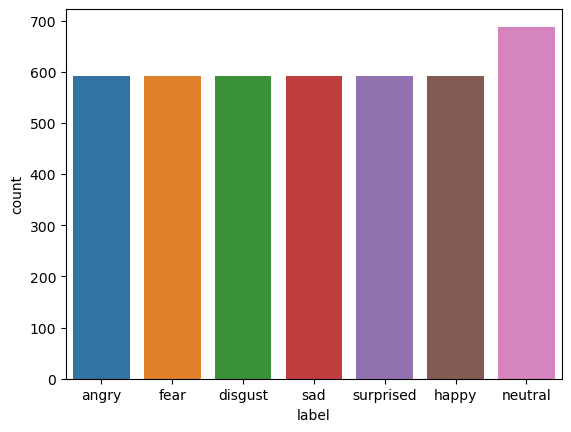

In [7]:

sns.countplot(data=df, x='label')

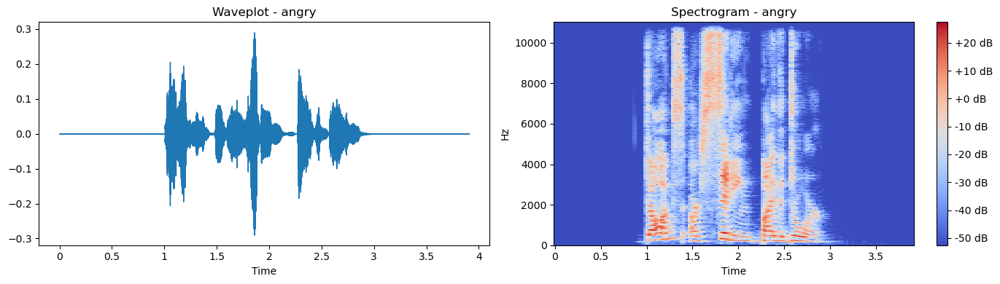

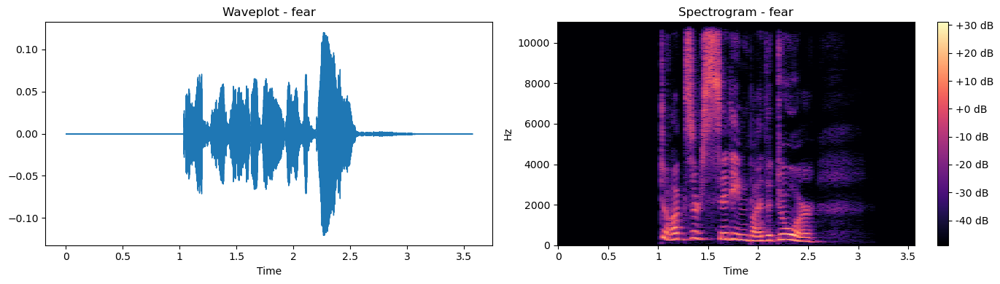

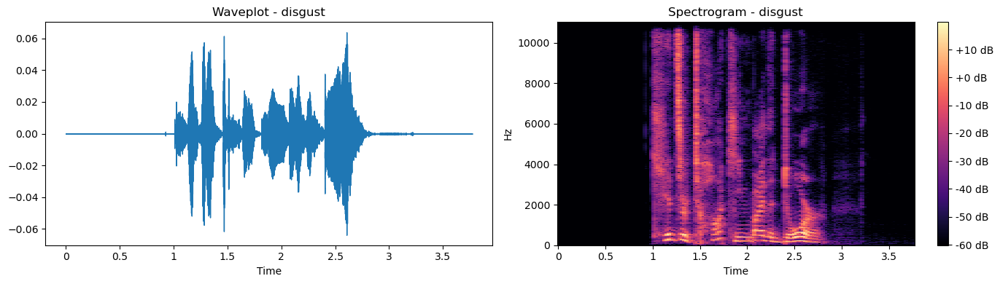

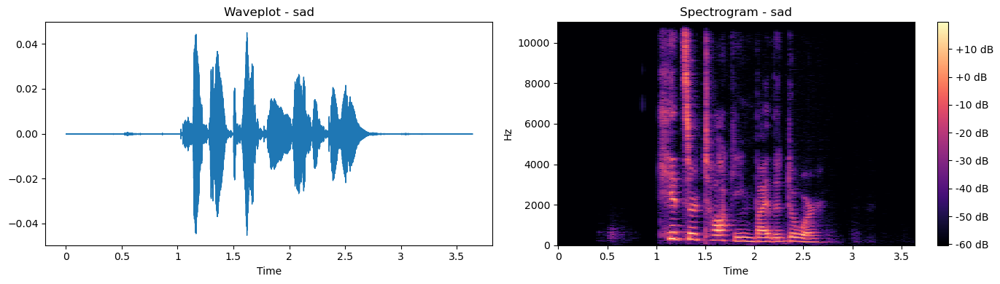

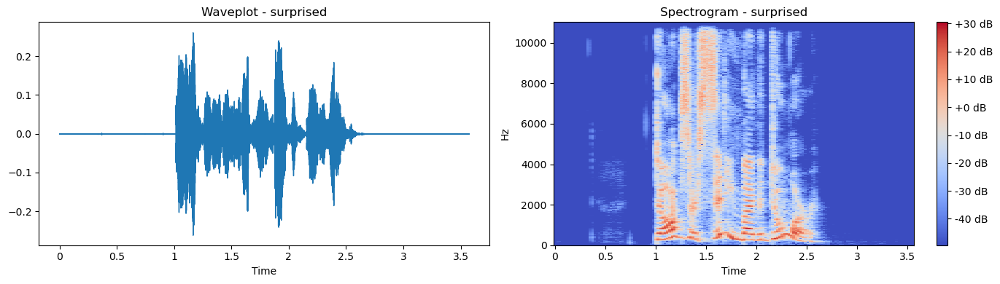

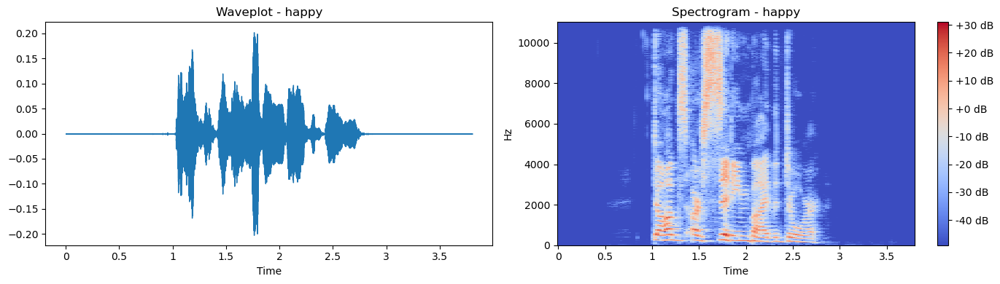

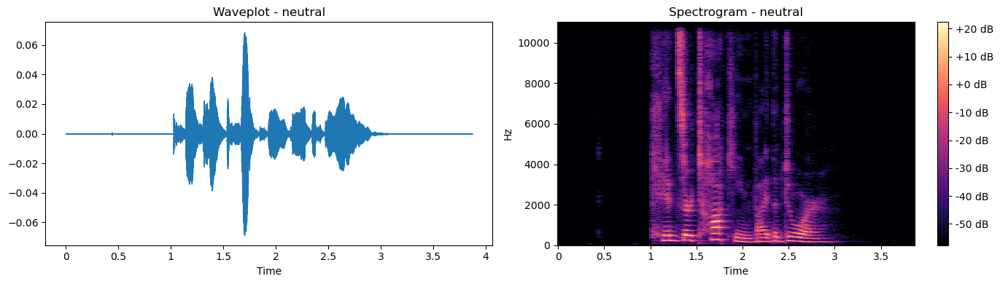

In [8]:
# Function to plot waveplot and spectrogram
def plot_wave_and_spectrogram(data, sr, emotion):
    plt.figure(figsize=(14, 4))
    
    # Waveplot
    plt.subplot(1, 2, 1)
    librosa.display.waveshow(data, sr=sr)
    plt.title(f'Waveplot - {emotion}')
    
    # Spectrogram
    plt.subplot(1, 2, 2)
    x = librosa.stft(data)
    xdb = librosa.amplitude_to_db(abs(x))
    librosa.display.specshow(xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram - {emotion}')
    
    plt.tight_layout()
    plt.show()

# Iterate through each label in the DataFrame and plot waveplot and spectrogram
for emotion in df['label'].unique():
    path = np.array(df['speech'][df['label'] == emotion])[0]
    data, sampling_rate = librosa.load(path)
    
    plot_wave_and_spectrogram(data, sampling_rate, emotion)

In [9]:
#Preprocessing 

In [10]:
#remove silence from audio data

In [11]:

def remove_silence(data):
    trimmed_data, _ = librosa.effects.trim(data)
    return trimmed_data


In [12]:
def remove_noise(audio, target_sr=16000):
    # Apply noise reduction using spectral subtraction
    stft = librosa.stft(audio)
    noise_estimation = np.mean(np.abs(stft), axis=1)
    clean_stft = np.maximum(np.abs(stft) - 2 * noise_estimation[:, np.newaxis], 0.0)
    clean_audio = librosa.istft(clean_stft)
    
    return clean_audio


In [13]:
# Remove silence from all the audio data

df['data'] = df['speech'].apply(lambda x: remove_silence(librosa.load(x)[0]))
df['data'] = df['speech'].apply(lambda x: remove_noise(librosa.load(x)[0]))

print(len(df))
print(df['label'].value_counts())


4240
label
neutral      688
angry        592
fear         592
disgust      592
sad          592
surprised    592
happy        592
Name: count, dtype: int64


In [14]:
df.head()

,speech,label,data
0,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,angry,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,fear,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,fear,"[1.4773227e-10, -1.4753579e-10, 1.4734915e-10,..."
3,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,angry,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,disgust,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [15]:

# Function to resample the trimmed audio data
def resample_audio(data, orig_sr, target_sr):
    resampled_data = librosa.resample(data, orig_sr=orig_sr, target_sr=target_sr)
    return resampled_data

In [16]:

# Set the target sampling rate to 16 kHz
target_sr = 16000

# Create a new column 'resampled_data' in the DataFrame
df['resampled_data'] = None

# Iterate through each row in the DataFrame
for index, row in df.iterrows():
    path = row['speech']
    emotion = row['label']
    data, original_sr = librosa.load(path)
    trimmed_data = remove_silence(data)
    resampled_data = resample_audio(trimmed_data, orig_sr=original_sr, target_sr=target_sr)
    
    # Save the resampled data to the 'resampled_data' column for the current row
    df.at[index, 'resampled_data'] = resampled_data

In [17]:
df.head()

,speech,label,data,resampled_data
0,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,angry,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[6.4473693e-07, -4.575985e-07, 4.1501175e-07, ..."
1,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,fear,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[3.4508055e-06, -2.946982e-06, 2.546004e-06, -..."
2,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,fear,"[1.4773227e-10, -1.4753579e-10, 1.4734915e-10,...","[0.00049381924, -2.471674e-05, -0.00061503367,..."
3,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,angry,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.0002623997, -9.1980706e-05, 0.00017316817,..."
4,/Users/narjesmishal/Desktop/Grad Project 🎓/Dat...,disgust,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.7028598e-08, -9.6266275e-09, 3.4175205e-09,..."


In [18]:
#pip install pydub

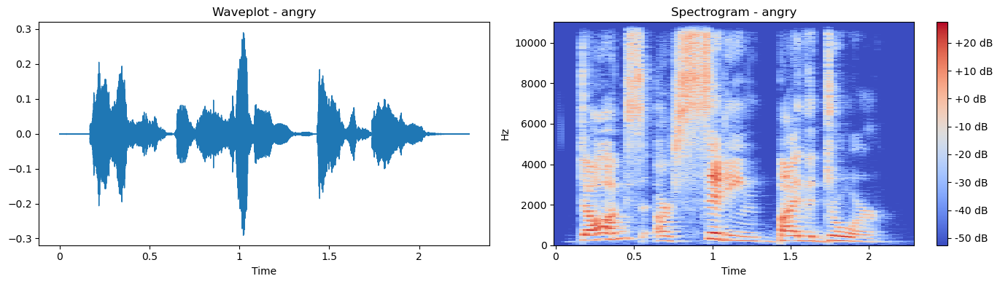

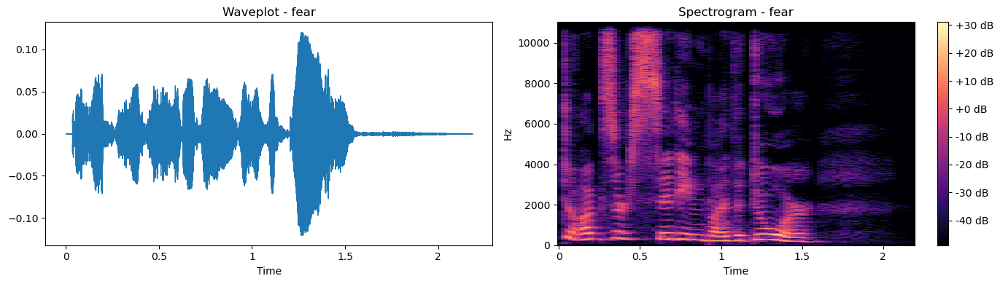

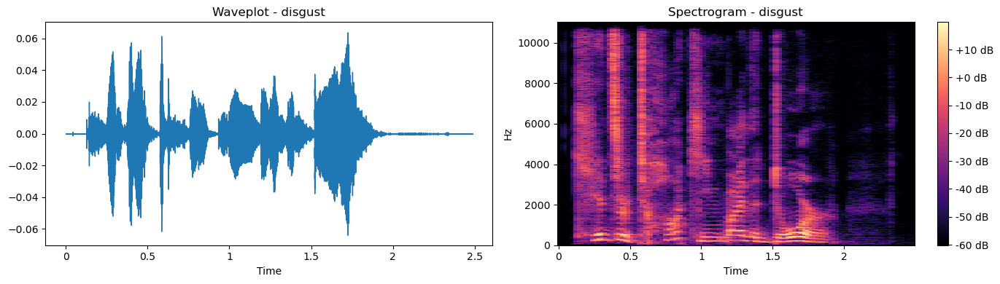

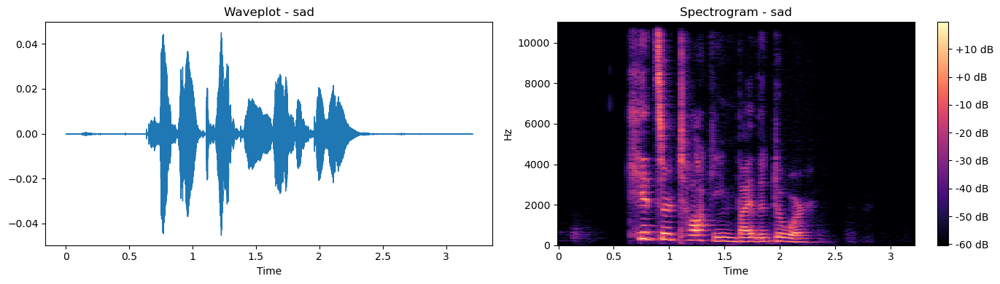

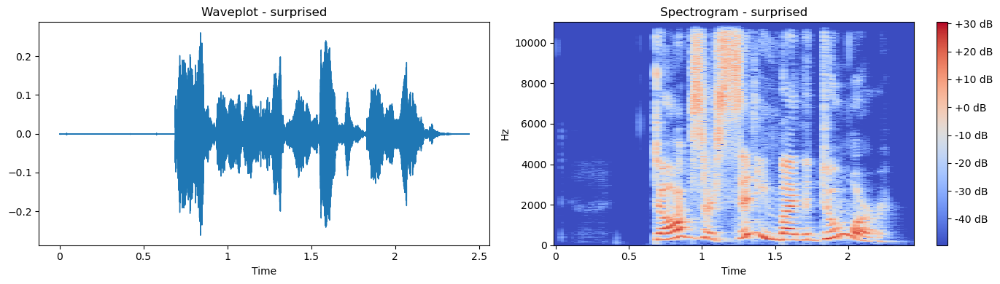

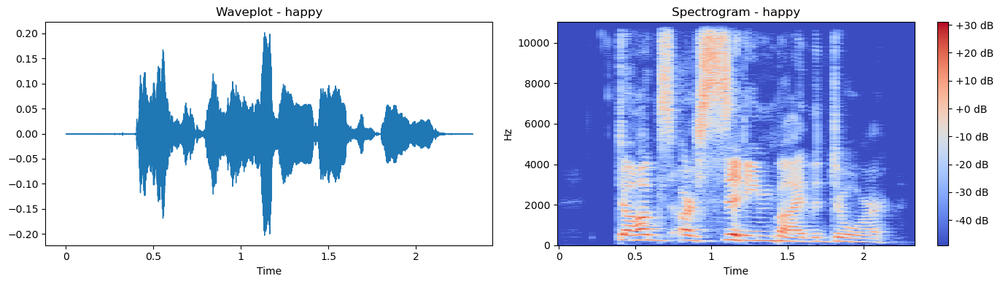

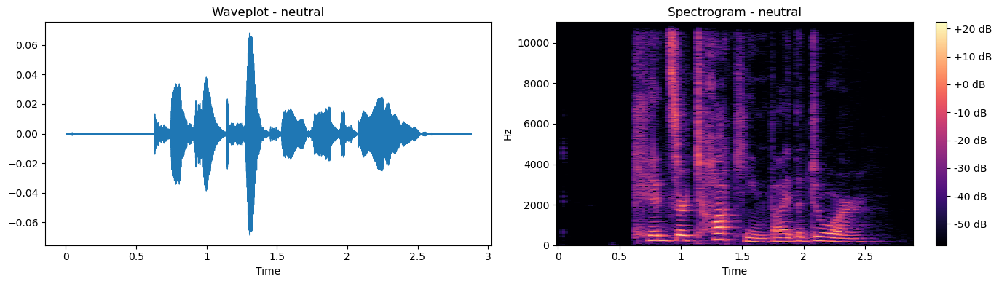

In [19]:
# Function to plot waveplot and spectrogram after removing the silence
def plot_wave_and_spectrogram(data, sr, emotion):
    plt.figure(figsize=(14, 4))
    
    # Waveplot
    plt.subplot(1, 2, 1)
    librosa.display.waveshow(data, sr=sr)
    plt.title(f'Waveplot - {emotion}')
    
    # Spectrogram
    plt.subplot(1, 2, 2)
    x = librosa.stft(data)
    xdb = librosa.amplitude_to_db(abs(x))
    librosa.display.specshow(xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram - {emotion}')
    
    plt.tight_layout()
    plt.show()

# Iterate through each label in the DataFrame and plot waveplot and spectrogram
for emotion in df['label'].unique():
    path = np.array(df['speech'][df['label'] == emotion])[0]
    data, sampling_rate = librosa.load(path)
    trimmed_data = remove_silence(data)
    
    plot_wave_and_spectrogram(trimmed_data, sampling_rate, emotion)

In [20]:
#Segment the data into 3 second segments

In [21]:

# Create a new DataFrame to store the resampled data
three_sec_df = pd.DataFrame(columns=['label', 'resampled_data'])

# Iterate through each row in the original DataFrame
for index, row in df.iterrows():
    path = row['speech']
    emotion = row['label']
    data, original_sr = librosa.load(path)
    trimmed_data = remove_silence(data)
    resampled_data = resample_audio(trimmed_data, orig_sr=original_sr, target_sr=target_sr)
    
    # Create a temporary DataFrame with the label and resampled data
    temp_df = pd.DataFrame({'label': [emotion], 'resampled_data': [resampled_data]})
    
    # Concatenate the temporary DataFrame with the resampled_df DataFrame
    three_sec_df = pd.concat([three_sec_df, temp_df], ignore_index=True)

In [22]:
print(three_sec_df.info())
three_sec_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   label           4240 non-null   object
 1   resampled_data  4240 non-null   object
dtypes: object(2)
memory usage: 66.4+ KB
None


,label,resampled_data
0,angry,"[6.4473693e-07, -4.575985e-07, 4.1501175e-07, ..."
1,fear,"[3.4508055e-06, -2.946982e-06, 2.546004e-06, -..."
2,fear,"[0.00049381924, -2.471674e-05, -0.00061503367,..."
3,angry,"[-0.0002623997, -9.1980706e-05, 0.00017316817,..."
4,disgust,"[2.7028598e-08, -9.6266275e-09, 3.4175205e-09,..."


<Axes: xlabel='label', ylabel='count'>

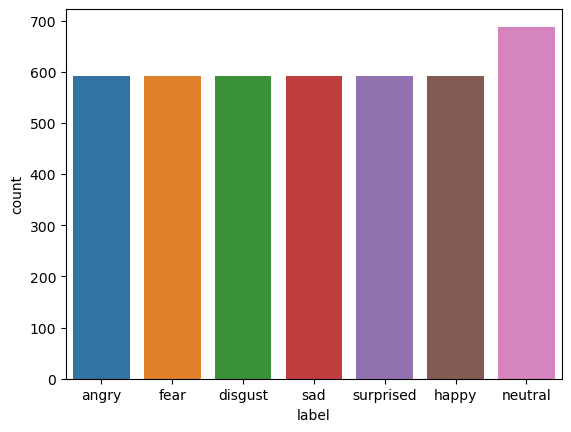

In [23]:
sns.countplot(data=three_sec_df, x='label')

In [24]:
#Segment the data into 2 second segments

In [25]:

# Create a new DataFrame to store the segmented data
two_sec_df = pd.DataFrame(columns=['label', 'segment'])

# Iterate through each row in the original DataFrame
for index, row in df.iterrows():
    path = row['speech']
    emotion = row['label']
    data, original_sr = librosa.load(path)
    trimmed_data = remove_silence(data)
    resampled_data = resample_audio(trimmed_data, orig_sr=original_sr, target_sr=target_sr)
    
    # Calculate the duration of each segment in seconds
    segment_duration = 2 * target_sr  

    # Segment the resampled data into 2-second segments
    segments = []
    for i in range(0, len(resampled_data), segment_duration):
        segment = resampled_data[i:i+segment_duration]
        segments.append(segment)

    # Create new rows in the new DataFrame for each segment
    for segment in segments:
        new_row = {'label': emotion, 'segment': segment}
        two_sec_df = pd.concat([two_sec_df, pd.DataFrame([new_row])], ignore_index=True)

In [26]:
print(two_sec_df.info())
two_sec_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7244 entries, 0 to 7243
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   label    7244 non-null   object
 1   segment  7244 non-null   object
dtypes: object(2)
memory usage: 113.3+ KB
None


,label,segment
0,angry,"[6.4473693e-07, -4.575985e-07, 4.1501175e-07, ..."
1,angry,"[0.0006234278, 0.0002012874, 0.00070421735, 0...."
2,fear,"[3.4508055e-06, -2.946982e-06, 2.546004e-06, -..."
3,fear,"[4.9781906e-05, 0.0001814467, 9.0181e-05, -4.6..."
4,fear,"[0.00049381924, -2.471674e-05, -0.00061503367,..."


<Axes: xlabel='label', ylabel='count'>

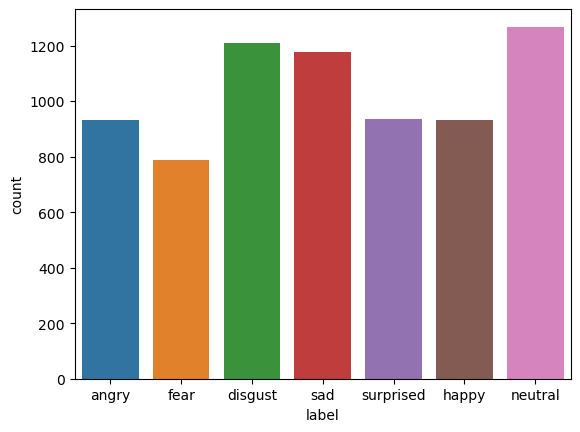

In [27]:
sns.countplot(data=two_sec_df, x='label')

In [28]:
#Segment the data into 1 second segments

In [29]:

# Create a new DataFrame to store the segmented data
one_sec_df = pd.DataFrame(columns=['label', 'segment'])

# Iterate through each row in the original DataFrame
for index, row in df.iterrows():
    path = row['speech']
    emotion = row['label']
    data, original_sr = librosa.load(path)
    trimmed_data = remove_silence(data)
    resampled_data = resample_audio(trimmed_data, orig_sr=original_sr, target_sr=target_sr)
    
    # Calculate the duration of each segment in seconds
    segment_duration = target_sr  
    
    # Segment the resampled data into 1-second segments
    segments = []
    for i in range(0, len(resampled_data), segment_duration):
        segment = resampled_data[i:i+segment_duration]
        segments.append(segment)
    
    # Create new rows in the new DataFrame for each segment
    for segment in segments:
        new_row = {'label': emotion, 'segment': segment}
        one_sec_df = pd.concat([one_sec_df, pd.DataFrame([new_row])], ignore_index=True)

In [30]:
print(one_sec_df.info())
one_sec_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12274 entries, 0 to 12273
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   label    12274 non-null  object
 1   segment  12274 non-null  object
dtypes: object(2)
memory usage: 191.9+ KB
None


,label,segment
0,angry,"[6.4473693e-07, -4.575985e-07, 4.1501175e-07, ..."
1,angry,"[0.008991222, 0.011346668, 0.011109257, 0.0068..."
2,angry,"[0.0006234278, 0.0002012874, 0.00070421735, 0...."
3,fear,"[3.4508055e-06, -2.946982e-06, 2.546004e-06, -..."
4,fear,"[-0.026886703, -0.026906423, -0.022945775, -0...."


<Axes: xlabel='label', ylabel='count'>

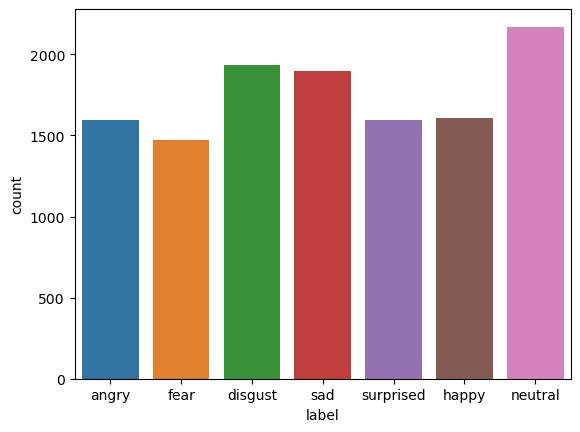

In [31]:
sns.countplot(data=one_sec_df, x='label')

In [32]:

# Create a new DataFrame to store the segmented data
onehalf_sec_df = pd.DataFrame(columns=['label', 'segment'])

# Iterate through each row in the original DataFrame
for index, row in df.iterrows():
    path = row['speech']
    emotion = row['label']
    data, original_sr = librosa.load(path)
    trimmed_data = remove_silence(data)
    resampled_data = resample_audio(trimmed_data, orig_sr=original_sr, target_sr=target_sr)
    
    # Calculate the duration of each segment in seconds
    segment_duration = int(1.5 * target_sr)  
    
    # Segment the resampled data into 1.5-second segments
    segments = []
    for i in range(0, len(resampled_data), segment_duration):
        segment = resampled_data[i:i+segment_duration]
        segments.append(segment)
    
    # Create new rows in the new DataFrame for each segment
    for segment in segments:
        new_row = {'label': emotion, 'segment': segment}
        onehalf_sec_df = pd.concat([onehalf_sec_df, pd.DataFrame([new_row])], ignore_index=True)

In [33]:
print(onehalf_sec_df.info())
onehalf_sec_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9170 entries, 0 to 9169
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   label    9170 non-null   object
 1   segment  9170 non-null   object
dtypes: object(2)
memory usage: 143.4+ KB
None


,label,segment
0,angry,"[6.4473693e-07, -4.575985e-07, 4.1501175e-07, ..."
1,angry,"[-0.05340723, 0.013432344, 0.0738288, 0.074399..."
2,fear,"[3.4508055e-06, -2.946982e-06, 2.546004e-06, -..."
3,fear,"[0.0008558014, 0.0032529007, 0.005530714, 0.00..."
4,fear,"[0.00049381924, -2.471674e-05, -0.00061503367,..."


<Axes: xlabel='label', ylabel='count'>

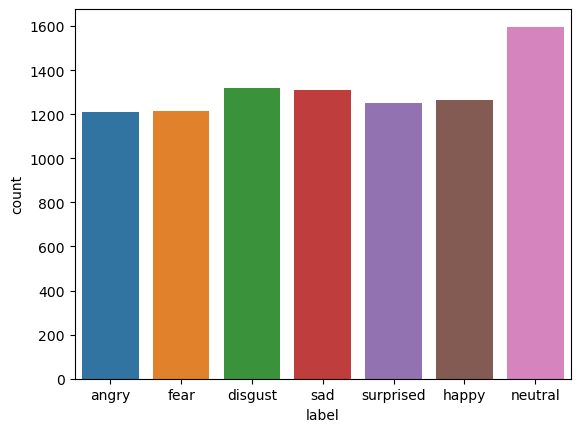

In [34]:
sns.countplot(data=onehalf_sec_df, x='label')

In [35]:
#Feature extraction

In [36]:
#Feature 1: MFCC

In [37]:

def extract_mfcc_features(audio):
    mfcc = librosa.feature.mfcc(y=audio, sr=sampling_rate)
    mfcc_mean = np.mean(mfcc, axis=1)
    return mfcc_mean


In [38]:
#Feature 2: Speech Rate

In [39]:
def extract_speech_rate_features(audio):
    speech_rate = librosa.feature.spectral_centroid(y=audio, sr=sampling_rate)
    speech_rate_mean = np.mean(speech_rate)
    return speech_rate_mean


In [40]:
#Feature 3: Energy

In [41]:
def extract_energy_features(audio):
    energy = librosa.feature.rms(y=audio)
    energy_mean = np.mean(energy)
    return energy_mean


In [42]:
#Feature 4: Pitch

In [43]:
def extract_pitch_features(audio):
    pitch = librosa.yin(y=audio, fmin=8, fmax=600)
    pitch_mean = np.mean(pitch)
    return pitch_mean


In [44]:
#Feature 5: ZCR (zero crossing rate)

In [45]:
def extract_zcr_features(audio):
    zcr = librosa.feature.zero_crossing_rate(audio)
    zcr_mean = np.mean(zcr)
    return zcr_mean


In [46]:
#Feature 6: Kurtosis

In [47]:
def extract_kurtosis_features(audio):
    mel_spec = librosa.feature.melspectrogram(y=audio, sr=sampling_rate)
    kurtosis = librosa.feature.mfcc(S=librosa.power_to_db(mel_spec))
    kurtosis_mean = np.mean(kurtosis)
    return kurtosis_mean


In [48]:
#three_sec_features extraction

In [49]:
# Create empty lists to store the extracted features
mfcc_features = []
speech_rate_features = []
energy_features = []
pitch_features = []
zcr_features = []
kurtosis_features = []

# Iterate through each row in the three_sec_df DataFrame
for index, row in three_sec_df.iterrows():
    audio = row['resampled_data']
    
    # Extract MFCC features
    mfcc_features.append(extract_mfcc_features(audio))
    
    # Extract speech rate features
    speech_rate_features.append(extract_speech_rate_features(audio))
    
    # Extract energy features
    energy_features.append(extract_energy_features(audio))
    
    # Extract pitch features
    pitch_features.append(extract_pitch_features(audio))
    
    # Extract zero crossing rate features
    zcr_features.append(extract_zcr_features(audio))
    
    # Extract kurtosis features
    kurtosis_features.append(extract_kurtosis_features(audio))

# Create a new DataFrame to store the extracted features
three_sec_features_df = pd.DataFrame({
    'label': three_sec_df['label'],
    'mfcc': mfcc_features,
    'speech_rate': speech_rate_features,
    'energy': energy_features,
    'pitch': pitch_features,
    'zcr': zcr_features,
    'kurtosis': kurtosis_features
})

# Save the features_df DataFrame to a CSV file
three_sec_features_df.to_csv('three_sec_features.csv', index=False)

In [50]:
print(three_sec_features_df.info())
three_sec_features_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   label        4240 non-null   object 
 1   mfcc         4240 non-null   object 
 2   speech_rate  4240 non-null   float64
 3   energy       4240 non-null   float32
 4   pitch        4240 non-null   float64
 5   zcr          4240 non-null   float64
 6   kurtosis     4240 non-null   float32
dtypes: float32(2), float64(3), object(2)
memory usage: 198.9+ KB
None


,label,mfcc,speech_rate,energy,pitch,zcr,kurtosis
0,angry,"[-402.3542, 45.49694, -16.031067, -13.1474, -2...",3384.480201,0.020303,289.908899,0.213331,-28.057354
1,fear,"[-442.84967, 50.083553, -16.972843, -2.3059964...",3202.806288,0.014130,283.084457,0.218538,-27.120562
2,fear,"[-351.5411, 5.673484, -35.926365, -2.951755, -...",3640.260859,0.052829,344.966897,0.260555,-20.871490
3,angry,"[-316.92148, 41.879536, -20.910177, -7.606141,...",3313.124788,0.043901,332.883644,0.184729,-19.924648
4,disgust,"[-506.0328, 63.114395, -6.2810144, -1.6642883,...",3244.833218,0.006626,264.885656,0.232034,-28.868820


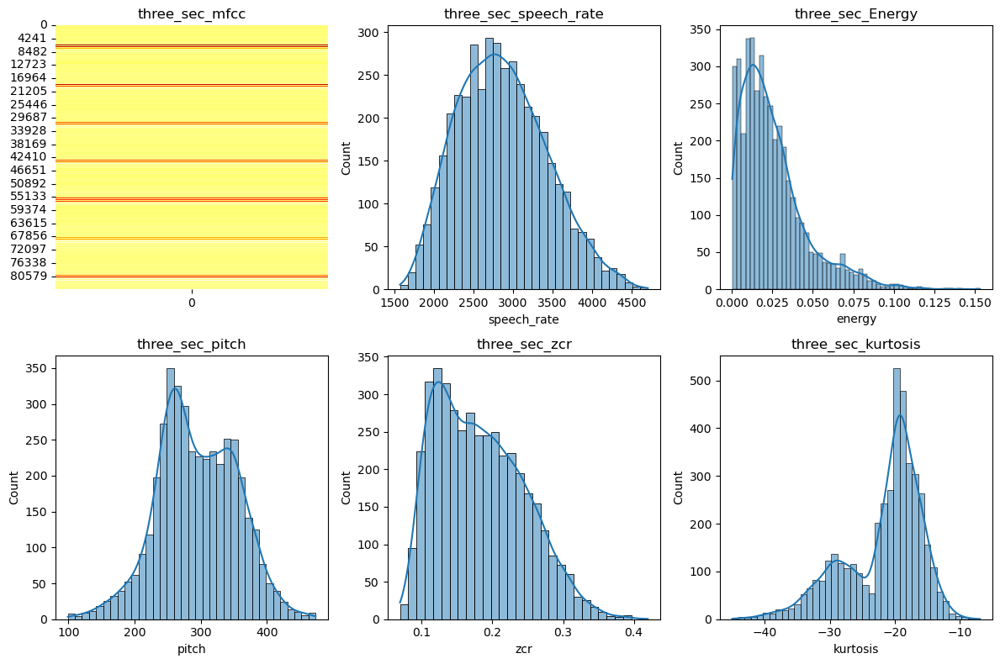

In [51]:
# Plotting the features
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
sns.heatmap(three_sec_features_df['mfcc'].apply(lambda x: x.reshape(-1, 1)).explode().tolist(), cmap='hot', cbar=False)
plt.title('three_sec_mfcc')

plt.subplot(2, 3, 2)
sns.histplot(three_sec_features_df['speech_rate'], kde=True)
plt.title('three_sec_speech_rate')

plt.subplot(2, 3, 3)
sns.histplot(three_sec_features_df['energy'], kde=True)
plt.title('three_sec_Energy')

plt.subplot(2, 3, 4)
sns.histplot(three_sec_features_df['pitch'], kde=True)
plt.title('three_sec_pitch')

plt.subplot(2, 3, 5)
sns.histplot(three_sec_features_df['zcr'], kde=True)
plt.title('three_sec_zcr')

plt.subplot(2, 3, 6)
sns.histplot(three_sec_features_df['kurtosis'], kde=True)
plt.title('three_sec_kurtosis')

plt.tight_layout()
plt.show()


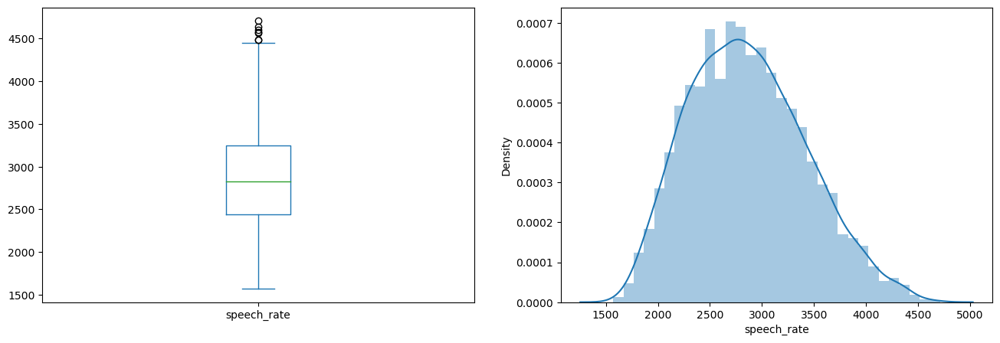

In [52]:
plt.figure(1)
plt.subplot(121)
three_sec_features_df['speech_rate'].plot.box(figsize=(16,5))

plt.subplot(122)
sns.distplot(three_sec_features_df['speech_rate'])
plt.show()

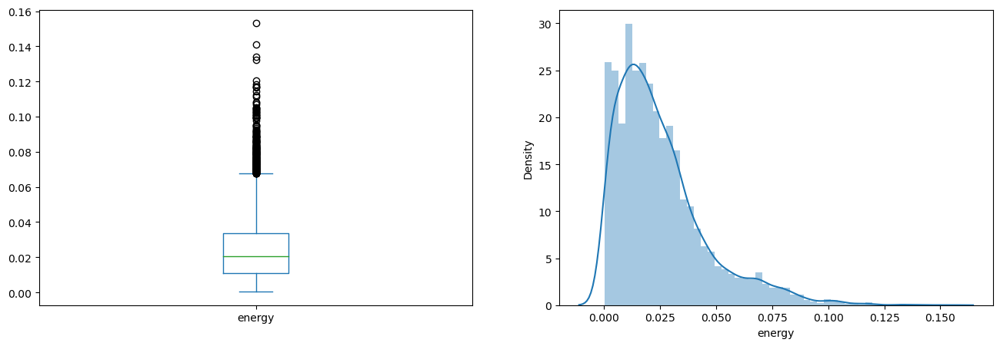

In [53]:
plt.figure(1)
plt.subplot(121)
three_sec_features_df['energy'].plot.box(figsize=(16,5))

plt.subplot(122)
sns.distplot(three_sec_features_df['energy'])
plt.show()

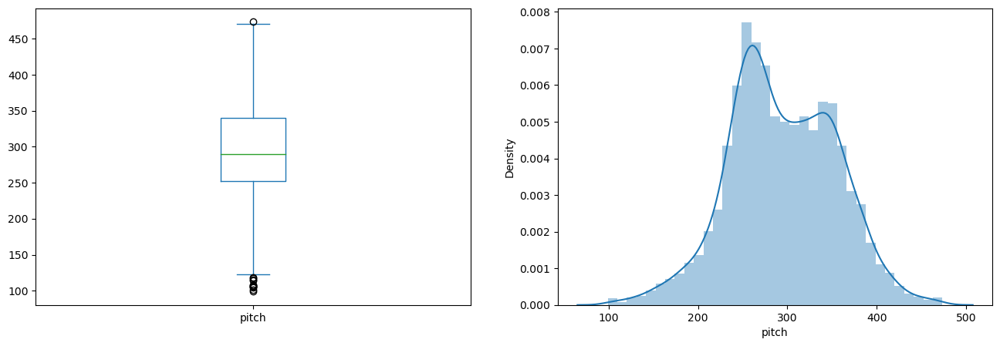

In [54]:
plt.figure(1)
plt.subplot(121)
three_sec_features_df['pitch'].plot.box(figsize=(16,5))

plt.subplot(122)
sns.distplot(three_sec_features_df['pitch'])
plt.show()

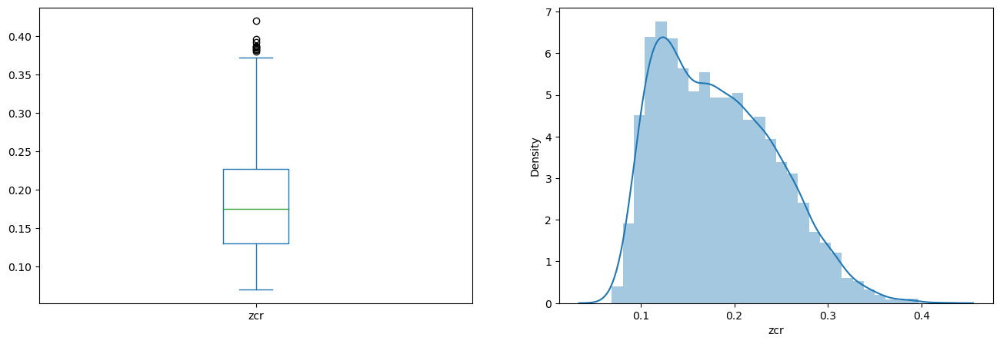

In [55]:
plt.figure(1)
plt.subplot(121)
three_sec_features_df['zcr'].plot.box(figsize=(16,5))

plt.subplot(122)
sns.distplot(three_sec_features_df['zcr'])
plt.show()

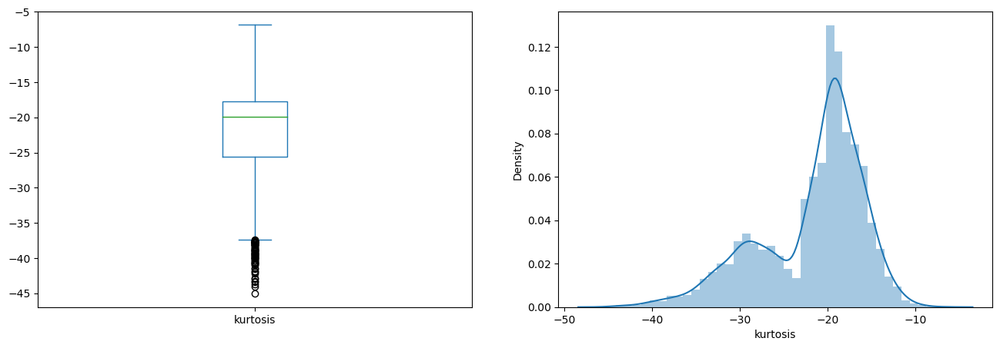

In [56]:
plt.figure(1)
plt.subplot(121)
three_sec_features_df['kurtosis'].plot.box(figsize=(16,5))

plt.subplot(122)
sns.distplot(three_sec_features_df['kurtosis'])
plt.show()

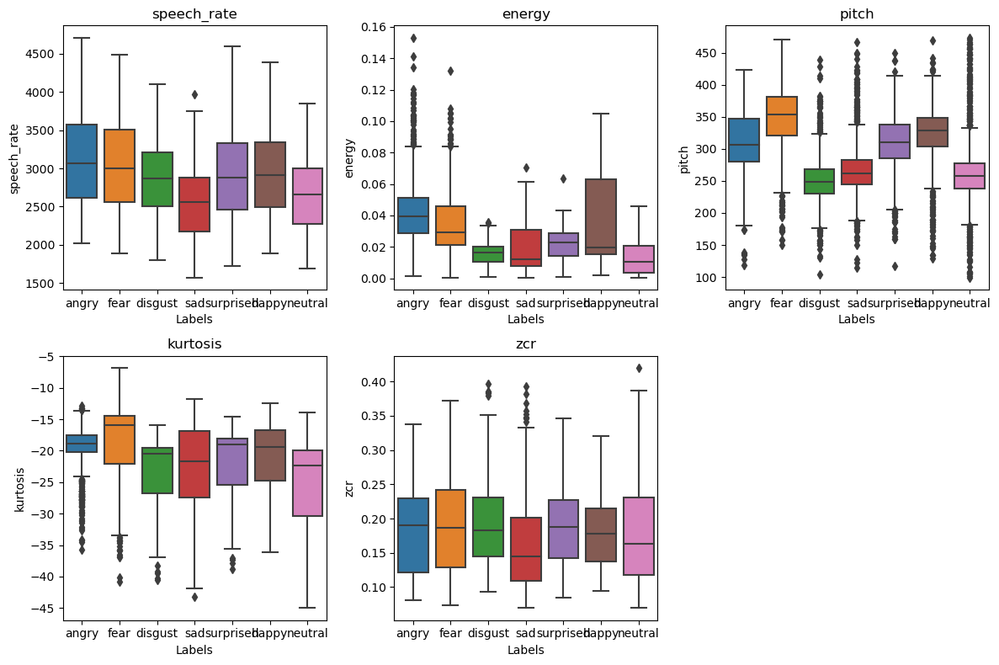

In [57]:
plt.figure(figsize=(12, 8))

features = ['speech_rate', 'energy', 'pitch', 'kurtosis', 'zcr'] 
labels = three_sec_features_df['label'].unique()

for i, feature in enumerate(features):
    plt.subplot(2, 3, i+1)
    
    # Create a list to store data for each label
    data_list = []
    
    for label in labels:
        data = three_sec_features_df[three_sec_features_df['label'] == label][feature]
        data_list.append(data)
    
    # Plotting boxplots with labels
    sns.boxplot(data=data_list)
    plt.xlabel('Labels')
    plt.ylabel(feature)
    plt.title(feature)
    
    # Map numbers to labels
    label_mapping = {label_num: label for label_num, label in enumerate(labels)}
    plt.xticks(range(len(labels)), [label_mapping[label_num] for label_num in range(len(labels))])

plt.tight_layout()
plt.show()

In [58]:
#split mfcc and concat it again

In [59]:

# Convert MFCC values to a list of dictionaries
mfcc_list = []
for mfcc_values in three_sec_features_df['mfcc']:
    mfcc_dict = {'MFCC_' + str(i): value for i, value in enumerate(mfcc_values)}
    mfcc_list.append(mfcc_dict)

# Create DataFrame from the list of dictionaries
mfcc_f_df = pd.DataFrame(mfcc_list)

#print the mfcc_f_df DataFrame
print(mfcc_f_df.head())

# Reset the indices of the DataFrames
mfcc_f_df.reset_index(drop=True, inplace=True)
three_sec_features_df.reset_index(drop=True, inplace=True)


       MFCC_0     MFCC_1     MFCC_2     MFCC_3     MFCC_4     MFCC_5  \
0 -402.354187  45.496941 -16.031067 -13.147400 -29.022640 -17.991621   
1 -442.849670  50.083553 -16.972843  -2.305996 -27.620070 -30.621143   
2 -351.541107   5.673484 -35.926365  -2.951755 -32.013847 -21.657850   
3 -316.921478  41.879536 -20.910177  -7.606141 -36.110779 -11.258243   
4 -506.032806  63.114395  -6.281014  -1.664288 -20.396168 -14.316367   

      MFCC_6     MFCC_7    MFCC_8     MFCC_9    MFCC_10    MFCC_11    MFCC_12  \
0 -26.971144 -14.377636 -4.878340 -16.097713 -12.607868  -7.904688 -16.217403   
1 -23.921528  -7.925880 -6.352033 -22.824310  -3.462013  -5.944592 -20.639635   
2 -16.141384  -6.728705 -0.360153  -3.910765  20.442192  15.450613   3.368968   
3 -18.356668 -13.610368  0.338091 -18.819710  -5.276726 -10.980542 -13.557753   
4 -21.415678  -2.098233 -3.243358 -11.200455  -6.810132  -3.233552 -17.623100   

     MFCC_13    MFCC_14   MFCC_15   MFCC_16   MFCC_17   MFCC_18   MFCC_19  
0  -

In [60]:
# Concatenate the DataFrames
three_sec_features_df = pd.concat([mfcc_f_df, three_sec_features_df], axis=1)

# Print the concatenated DataFrame
print(three_sec_features_df.head())

       MFCC_0     MFCC_1     MFCC_2     MFCC_3     MFCC_4     MFCC_5  \
0 -402.354187  45.496941 -16.031067 -13.147400 -29.022640 -17.991621   
1 -442.849670  50.083553 -16.972843  -2.305996 -27.620070 -30.621143   
2 -351.541107   5.673484 -35.926365  -2.951755 -32.013847 -21.657850   
3 -316.921478  41.879536 -20.910177  -7.606141 -36.110779 -11.258243   
4 -506.032806  63.114395  -6.281014  -1.664288 -20.396168 -14.316367   

      MFCC_6     MFCC_7    MFCC_8     MFCC_9  ...   MFCC_17   MFCC_18  \
0 -26.971144 -14.377636 -4.878340 -16.097713  ...  2.542727 -9.080364   
1 -23.921528  -7.925880 -6.352033 -22.824310  ...  9.431761  8.113358   
2 -16.141384  -6.728705 -0.360153  -3.910765  ...  0.076636 -0.864680   
3 -18.356668 -13.610368  0.338091 -18.819710  ...  9.520529  4.870512   
4 -21.415678  -2.098233 -3.243358 -11.200455  ... -1.365233 -2.073874   

    MFCC_19    label                                               mfcc  \
0  2.251245    angry  [-402.3542, 45.49694, -16.03106

In [61]:

#drop the MFCC column
three_sec_features_df = three_sec_features_df.drop('mfcc', axis=1)
three_sec_features_df.head()

,MFCC_0,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,...,MFCC_16,MFCC_17,MFCC_18,MFCC_19,label,speech_rate,energy,pitch,zcr,kurtosis
0,-402.354187,45.496941,-16.031067,-13.147400,-29.022640,-17.991621,-26.971144,-14.377636,-4.878340,-16.097713,...,-3.322900,2.542727,-9.080364,2.251245,angry,3384.480201,0.020303,289.908899,0.213331,-28.057354
1,-442.849670,50.083553,-16.972843,-2.305996,-27.620070,-30.621143,-23.921528,-7.925880,-6.352033,-22.824310,...,3.359721,9.431761,8.113358,1.870718,fear,3202.806288,0.014130,283.084457,0.218538,-27.120562
2,-351.541107,5.673484,-35.926365,-2.951755,-32.013847,-21.657850,-16.141384,-6.728705,-0.360153,-3.910765,...,-9.800092,0.076636,-0.864680,1.787863,fear,3640.260859,0.052829,344.966897,0.260555,-20.871490
3,-316.921478,41.879536,-20.910177,-7.606141,-36.110779,-11.258243,-18.356668,-13.610368,0.338091,-18.819710,...,3.701170,9.520529,4.870512,5.725667,angry,3313.124788,0.043901,332.883644,0.184729,-19.924648
4,-506.032806,63.114395,-6.281014,-1.664288,-20.396168,-14.316367,-21.415678,-2.098233,-3.243358,-11.200455,...,-5.247499,-1.365233,-2.073874,-0.868892,disgust,3244.833218,0.006626,264.885656,0.232034,-28.868820


In [62]:
three_sec_features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MFCC_0       4240 non-null   float32
 1   MFCC_1       4240 non-null   float32
 2   MFCC_2       4240 non-null   float32
 3   MFCC_3       4240 non-null   float32
 4   MFCC_4       4240 non-null   float32
 5   MFCC_5       4240 non-null   float32
 6   MFCC_6       4240 non-null   float32
 7   MFCC_7       4240 non-null   float32
 8   MFCC_8       4240 non-null   float32
 9   MFCC_9       4240 non-null   float32
 10  MFCC_10      4240 non-null   float32
 11  MFCC_11      4240 non-null   float32
 12  MFCC_12      4240 non-null   float32
 13  MFCC_13      4240 non-null   float32
 14  MFCC_14      4240 non-null   float32
 15  MFCC_15      4240 non-null   float32
 16  MFCC_16      4240 non-null   float32
 17  MFCC_17      4240 non-null   float32
 18  MFCC_18      4240 non-null   float32
 19  MFCC_1

In [63]:

three_sec_features_df.describe()

,MFCC_0,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,...,MFCC_15,MFCC_16,MFCC_17,MFCC_18,MFCC_19,speech_rate,energy,pitch,zcr,kurtosis
count,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,...,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000,4240.000000
mean,-445.858032,53.405979,-6.710929,1.891659,-11.742063,-9.131626,-15.223810,-5.229382,-3.388601,-3.379825,...,1.966079,-1.514710,5.053976,3.227732,4.763288,2865.104585,0.025155,294.269701,0.182536,-21.709511
std,111.619675,24.141367,17.611984,13.518026,13.196457,9.480856,7.461878,7.785799,6.045772,5.967245,...,7.696784,7.719418,8.941963,10.195465,7.757473,561.871990,0.020332,60.068080,0.061997,5.961494
min,-847.784729,-46.275486,-91.203888,-39.732204,-60.761292,-40.666698,-42.581005,-29.650391,-25.797045,-30.708776,...,-15.293754,-18.767406,-19.276863,-17.966427,-16.226097,1570.732531,0.000364,98.956077,0.069286,-45.034004
25%,-511.453423,36.000355,-17.007461,-7.760088,-21.602925,-16.168282,-20.379122,-10.600937,-7.689366,-7.217787,...,-2.917503,-5.725253,-0.583373,-2.420081,-0.056385,2441.262532,0.010743,252.750440,0.129986,-25.550732
50%,-422.330109,54.889629,-6.227021,2.360300,-11.328060,-9.519711,-14.982951,-4.525854,-3.255957,-3.304815,...,0.789215,-3.149235,3.499041,1.013400,3.215079,2826.465928,0.020341,290.181093,0.174779,-19.877439
75%,-372.272736,71.197895,3.993415,12.438726,-0.979554,-2.142700,-9.770406,0.404420,1.023930,0.555507,...,5.891596,0.106375,8.196343,5.450313,7.782080,3246.834036,0.033459,340.137948,0.227112,-17.701797
max,-202.056137,121.125015,50.727291,38.696648,18.078573,19.632111,13.033704,18.838972,34.534458,25.914341,...,41.590466,40.318115,43.254292,45.038914,36.158100,4709.655480,0.153147,473.532410,0.419906,-6.833107


In [64]:
#two_sec_features extraction

In [65]:

# Create empty lists to store the extracted features
mfcc_features = []
speech_rate_features = []
energy_features = []
pitch_features = []
zcr_features = []
kurtosis_features = []

# Iterate through each row in the two_sec_df DataFrame
for index, row in two_sec_df.iterrows():
    audio = row['segment']
    
    # Extract MFCC features
    mfcc_features.append(extract_mfcc_features(audio))
    
    # Extract speech rate features
    speech_rate_features.append(extract_speech_rate_features(audio))
    
    # Extract energy features
    energy_features.append(extract_energy_features(audio))
    
    # Extract pitch features
    pitch_features.append(extract_pitch_features(audio))
    
    # Extract zero crossing rate features
    zcr_features.append(extract_zcr_features(audio))
    
    # Extract kurtosis features
    kurtosis_features.append(extract_kurtosis_features(audio))

# Create a new DataFrame to store the extracted features
two_sec_features_df = pd.DataFrame({
    'label': two_sec_df['label'],
    'mfcc': mfcc_features,
    'speech_rate': speech_rate_features,
    'energy': energy_features,
    'pitch': pitch_features,
    'zcr': zcr_features,
    'kurtosis': kurtosis_features
})

# Save the features_df DataFrame to a CSV file
two_sec_features_df.to_csv('two_sec_features.csv', index=False)

In [66]:
print(two_sec_features_df.info())
two_sec_features_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7244 entries, 0 to 7243
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   label        7244 non-null   object 
 1   mfcc         7244 non-null   object 
 2   speech_rate  7244 non-null   float64
 3   energy       7244 non-null   float32
 4   pitch        7244 non-null   float64
 5   zcr          7244 non-null   float64
 6   kurtosis     7244 non-null   float32
dtypes: float32(2), float64(3), object(2)
memory usage: 339.7+ KB
None


,label,mfcc,speech_rate,energy,pitch,zcr,kurtosis
0,angry,"[-367.90845, 41.47591, -18.456926, -14.399519,...",3550.323755,0.022938,299.829386,0.229957,-27.212654
1,angry,"[-655.9861, 112.6067, -4.058913, -3.1274214, 2...",2121.109653,0.001389,195.763016,0.083442,-32.082344
2,fear,"[-420.03094, 53.277035, -18.626661, -3.7879052...",3164.197947,0.015464,304.661700,0.207016,-26.410389
3,fear,"[-713.82056, 41.905186, -10.841863, 27.753096,...",3646.397491,0.000110,146.819470,0.277751,-35.381145
4,fear,"[-367.9574, 0.049128577, -30.444927, -0.766583...",3825.245272,0.043050,360.584233,0.282916,-21.576555


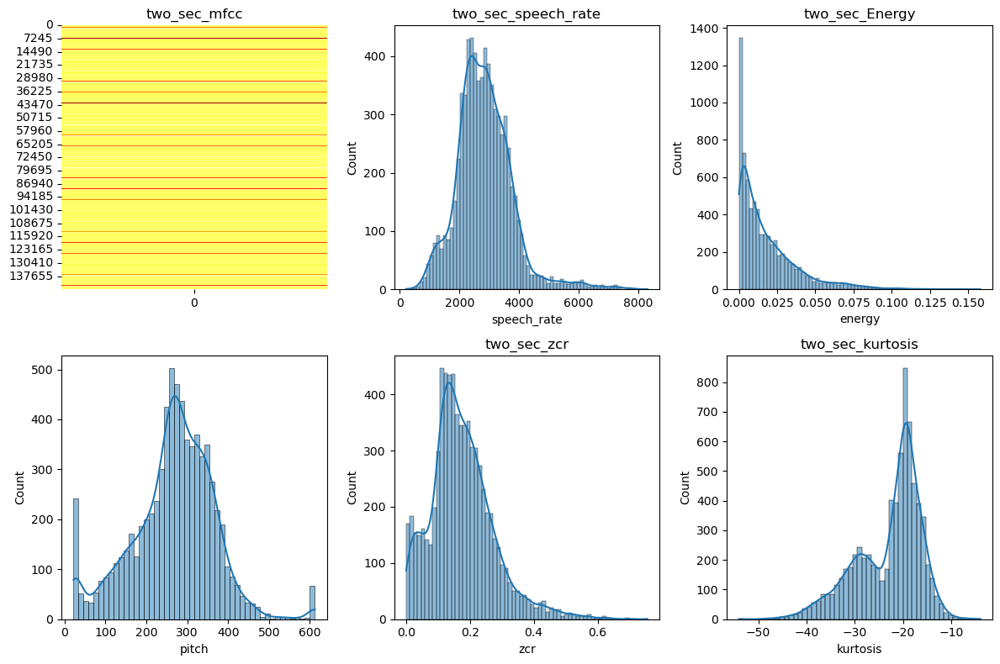

In [67]:
# Plotting the features
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
sns.heatmap(two_sec_features_df['mfcc'].apply(lambda x: x.reshape(-1, 1)).explode().tolist(), cmap='hot', cbar=False)
plt.title('two_sec_mfcc')

plt.subplot(2, 3, 2)
sns.histplot(two_sec_features_df['speech_rate'], kde=True)
plt.title('two_sec_speech_rate')

plt.subplot(2, 3, 3)
sns.histplot(two_sec_features_df['energy'], kde=True)
plt.title('two_sec_Energy')

plt.subplot(2, 3, 4)
sns.histplot(two_sec_features_df['pitch'], kde=True)

plt.subplot(2, 3, 5)
sns.histplot(two_sec_features_df['zcr'], kde=True)
plt.title('two_sec_zcr')

plt.subplot(2, 3, 6)
sns.histplot(two_sec_features_df['kurtosis'], kde=True)
plt.title('two_sec_kurtosis')

plt.tight_layout()
plt.show()


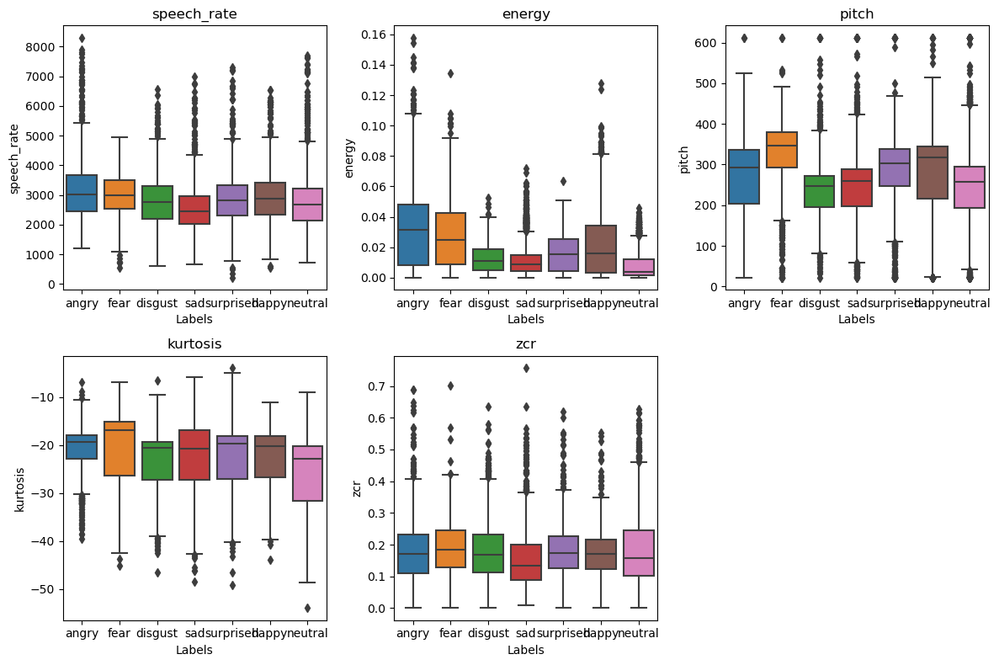

In [68]:
plt.figure(figsize=(12, 8))

features = ['speech_rate', 'energy', 'pitch', 'kurtosis', 'zcr']
labels = two_sec_features_df['label'].unique()

for i, feature in enumerate(features):
    plt.subplot(2, 3, i+1)
    
    # Create a list to store data for each label
    data_list = []
    
    for label in labels:
        data = two_sec_features_df[two_sec_features_df['label'] == label][feature]
        data_list.append(data)
    
    # Plotting boxplots with labels
    sns.boxplot(data=data_list)
    plt.xlabel('Labels')
    plt.ylabel(feature)
    plt.title(feature)
    
    # Map numbers to labels
    label_mapping = {label_num: label for label_num, label in enumerate(labels)}
    plt.xticks(range(len(labels)), [label_mapping[label_num] for label_num in range(len(labels))])

plt.tight_layout()
plt.show()

In [69]:
#split mfcc and concat it again

In [70]:

# Convert MFCC values to a list of dictionaries
mfcc_list = []
for mfcc_values in two_sec_features_df['mfcc']:
    mfcc_dict = {'MFCC_' + str(i): value for i, value in enumerate(mfcc_values)}
    mfcc_list.append(mfcc_dict)

# Create DataFrame from the list of dictionaries
mfcc_f_df = pd.DataFrame(mfcc_list)

#print the mfcc_f_df DataFrame
print(mfcc_f_df.head())

# Reset the indices of the DataFrames
mfcc_f_df.reset_index(drop=True, inplace=True)
two_sec_features_df.reset_index(drop=True, inplace=True)


       MFCC_0      MFCC_1     MFCC_2     MFCC_3     MFCC_4     MFCC_5  \
0 -367.908447   41.475910 -18.456926 -14.399519 -35.789646 -19.607805   
1 -655.986084  112.606697  -4.058913  -3.127421  22.648708  -7.317529   
2 -420.030945   53.277035 -18.626661  -3.787905 -30.303879 -32.914448   
3 -713.820557   41.905186 -10.841863  27.753096  -7.768713  -4.569365   
4 -367.957397    0.049129 -30.444927  -0.766583 -33.084743 -20.987350   

      MFCC_6     MFCC_7    MFCC_8     MFCC_9    MFCC_10    MFCC_11    MFCC_12  \
0 -27.855032 -15.981576 -6.369833 -17.544600 -12.053007  -7.973589 -17.108448   
1 -24.529654   1.330291  6.853499  -1.398296 -19.852018  -5.118433 -10.837395   
2 -25.549755  -9.492293 -7.346010 -24.034727  -4.396636  -6.685411 -21.337221   
3 -15.202805  15.788791  5.992011 -15.672989  10.126792   4.294738 -23.816965   
4 -13.794527  -6.551931 -2.626084   0.168525  19.223532  14.730918   7.678372   

     MFCC_13    MFCC_14   MFCC_15    MFCC_16    MFCC_17   MFCC_18   MFCC_1

In [71]:
# Concatenate the DataFrames
two_sec_features_df = pd.concat([mfcc_f_df, two_sec_features_df], axis=1)

# Print the concatenated DataFrame
print(two_sec_features_df.head())

       MFCC_0      MFCC_1     MFCC_2     MFCC_3     MFCC_4     MFCC_5  \
0 -367.908447   41.475910 -18.456926 -14.399519 -35.789646 -19.607805   
1 -655.986084  112.606697  -4.058913  -3.127421  22.648708  -7.317529   
2 -420.030945   53.277035 -18.626661  -3.787905 -30.303879 -32.914448   
3 -713.820557   41.905186 -10.841863  27.753096  -7.768713  -4.569365   
4 -367.957397    0.049129 -30.444927  -0.766583 -33.084743 -20.987350   

      MFCC_6     MFCC_7    MFCC_8     MFCC_9  ...    MFCC_17   MFCC_18  \
0 -27.855032 -15.981576 -6.369833 -17.544600  ...   4.337739 -9.243645   
1 -24.529654   1.330291  6.853499  -1.398296  ... -11.523915 -9.140912   
2 -25.549755  -9.492293 -7.346010 -24.034727  ...  10.557057  8.900340   
3 -15.202805  15.788791  5.992011 -15.672989  ...  -3.505018 -0.403740   
4 -13.794527  -6.551931 -2.626084   0.168525  ...  -0.697421 -0.683452   

    MFCC_19  label                                               mfcc  \
0  3.517603  angry  [-367.90845, 41.47591, 

In [72]:

#drop the MFCC column
two_sec_features_df = two_sec_features_df.drop('mfcc', axis=1)
two_sec_features_df.head()

,MFCC_0,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,...,MFCC_16,MFCC_17,MFCC_18,MFCC_19,label,speech_rate,energy,pitch,zcr,kurtosis
0,-367.908447,41.475910,-18.456926,-14.399519,-35.789646,-19.607805,-27.855032,-15.981576,-6.369833,-17.544600,...,-3.223881,4.337739,-9.243645,3.517603,angry,3550.323755,0.022938,299.829386,0.229957,-27.212654
1,-655.986084,112.606697,-4.058913,-3.127421,22.648708,-7.317529,-24.529654,1.330291,6.853499,-1.398296,...,-4.986732,-11.523915,-9.140912,-4.052466,angry,2121.109653,0.001389,195.763016,0.083442,-32.082344
2,-420.030945,53.277035,-18.626661,-3.787905,-30.303879,-32.914448,-25.549755,-9.492293,-7.346010,-24.034727,...,4.315966,10.557057,8.900340,2.541027,fear,3164.197947,0.015464,304.661700,0.207016,-26.410389
3,-713.820557,41.905186,-10.841863,27.753096,-7.768713,-4.569365,-15.202805,15.788791,5.992011,-15.672989,...,-7.347065,-3.505018,-0.403740,-4.806719,fear,3646.397491,0.000110,146.819470,0.277751,-35.381145
4,-367.957397,0.049129,-30.444927,-0.766583,-33.084743,-20.987350,-13.794527,-6.551931,-2.626084,0.168525,...,-10.474504,-0.697421,-0.683452,-0.028573,fear,3825.245272,0.043050,360.584233,0.282916,-21.576555


In [73]:
two_sec_features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7244 entries, 0 to 7243
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MFCC_0       7244 non-null   float32
 1   MFCC_1       7244 non-null   float32
 2   MFCC_2       7244 non-null   float32
 3   MFCC_3       7244 non-null   float32
 4   MFCC_4       7244 non-null   float32
 5   MFCC_5       7244 non-null   float32
 6   MFCC_6       7244 non-null   float32
 7   MFCC_7       7244 non-null   float32
 8   MFCC_8       7244 non-null   float32
 9   MFCC_9       7244 non-null   float32
 10  MFCC_10      7244 non-null   float32
 11  MFCC_11      7244 non-null   float32
 12  MFCC_12      7244 non-null   float32
 13  MFCC_13      7244 non-null   float32
 14  MFCC_14      7244 non-null   float32
 15  MFCC_15      7244 non-null   float32
 16  MFCC_16      7244 non-null   float32
 17  MFCC_17      7244 non-null   float32
 18  MFCC_18      7244 non-null   float32
 19  MFCC_1

In [74]:
two_sec_features_df.describe()

,MFCC_0,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,...,MFCC_15,MFCC_16,MFCC_17,MFCC_18,MFCC_19,speech_rate,energy,pitch,zcr,kurtosis
count,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,...,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000,7244.000000
mean,-493.045776,59.807961,-2.618401,6.227686,-7.854930,-5.401867,-12.158077,-2.435504,-2.210606,-2.599801,...,1.461753,-2.124319,3.235212,1.798349,3.348757,2843.834906,0.018304,265.750579,0.175326,-22.857880
std,140.993759,36.111313,23.486979,17.950491,16.349579,13.581022,11.022699,10.636112,8.212293,7.912618,...,7.570837,7.260334,8.319353,8.976711,7.333126,940.924605,0.020003,101.889890,0.100071,6.715534
min,-1091.094238,-107.400047,-106.403175,-90.398911,-74.213890,-58.697491,-61.580372,-47.537361,-41.999207,-40.295605,...,-21.836491,-25.580233,-20.011620,-22.112627,-22.165678,209.735468,0.000001,21.554252,0.000000,-54.019756
25%,-571.168686,36.573790,-16.757951,-5.094716,-19.521605,-14.893164,-19.605006,-9.296236,-7.593150,-7.321231,...,-3.251872,-6.229786,-1.785306,-3.292450,-1.142643,2256.014669,0.003703,211.070244,0.111878,-27.484260
50%,-466.596939,60.634413,-3.467177,6.639992,-6.681934,-6.494746,-12.591215,-2.591067,-2.363592,-2.751732,...,0.627574,-3.183280,2.142949,0.303837,2.310822,2770.388875,0.011706,273.483668,0.162828,-20.622754
75%,-390.597908,81.475592,11.321589,17.167766,3.762542,2.691139,-5.839178,3.707327,2.808361,2.221002,...,5.455238,0.499580,6.902541,4.664415,6.564822,3349.433378,0.025862,331.259472,0.226663,-18.313825
max,-160.876419,195.958008,81.910332,82.666725,49.698608,58.831505,36.956501,41.569706,41.289658,37.432457,...,41.590466,40.318115,43.254292,45.038914,36.158100,8308.409634,0.157835,612.500000,0.756855,-3.947127


In [75]:
#one_sec_features extraction

In [76]:

# Create empty lists to store the extracted features
mfcc_features = []
speech_rate_features = []
energy_features = []
pitch_features = []
zcr_features = []
kurtosis_features = []

# Iterate through each row in the one_sec_df DataFrame
for index, row in one_sec_df.iterrows():
    audio = row['segment']
    
    # Extract MFCC features
    mfcc_features.append(extract_mfcc_features(audio))
    
    # Extract speech rate features
    speech_rate_features.append(extract_speech_rate_features(audio))
    
    # Extract energy features
    energy_features.append(extract_energy_features(audio))
    
    # Extract pitch features
    pitch_features.append(extract_pitch_features(audio))
    
    # Extract zero crossing rate features
    zcr_features.append(extract_zcr_features(audio))
    
    # Extract kurtosis features
    kurtosis_features.append(extract_kurtosis_features(audio))

# Create a new DataFrame to store the extracted features
one_sec_features_df = pd.DataFrame({
    'label': one_sec_df['label'],
    'mfcc': mfcc_features,
    'speech_rate': speech_rate_features,
    'energy': energy_features,
    'pitch': pitch_features,
    'zcr': zcr_features,
    'kurtosis': kurtosis_features
})

# Save the features_df DataFrame to a CSV file
one_sec_features_df.to_csv('one_sec_features.csv', index=False)

In [77]:
print(one_sec_features_df.info())
one_sec_features_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12274 entries, 0 to 12273
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   label        12274 non-null  object 
 1   mfcc         12274 non-null  object 
 2   speech_rate  12274 non-null  float64
 3   energy       12274 non-null  float32
 4   pitch        12274 non-null  float64
 5   zcr          12274 non-null  float64
 6   kurtosis     12274 non-null  float32
dtypes: float32(2), float64(3), object(2)
memory usage: 575.5+ KB
None


,label,mfcc,speech_rate,energy,pitch,zcr,kurtosis
0,angry,"[-380.72095, 11.379191, -16.71709, -30.70985, ...",4671.352730,0.020579,290.143918,0.348740,-27.066853
1,angry,"[-349.95502, 75.93156, -20.315983, 1.9250908, ...",2415.019843,0.024109,297.041489,0.098465,-26.866858
2,angry,"[-655.9861, 112.6067, -4.058913, -3.1274214, 2...",2121.109653,0.001389,195.763016,0.083442,-32.082344
3,fear,"[-375.86487, 32.591972, -12.592405, -12.226795...",3786.256122,0.015825,379.024157,0.249237,-24.473726
4,fear,"[-462.8429, 76.28035, -22.445457, 5.8493266, -...",2514.232647,0.014560,231.266332,0.157913,-27.614307


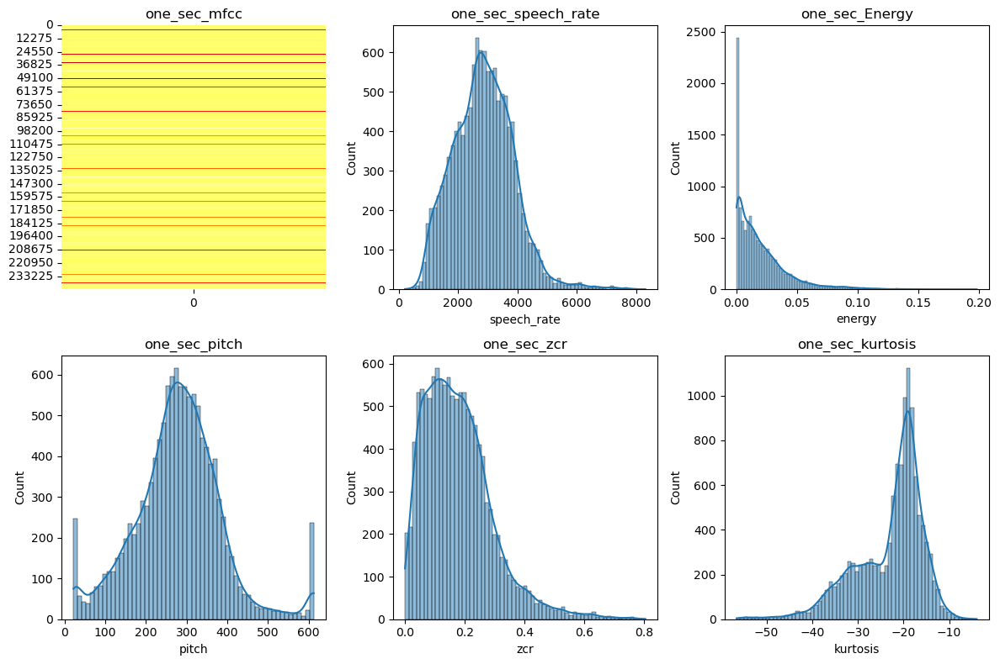

In [78]:
# Plotting the features
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
sns.heatmap(one_sec_features_df['mfcc'].apply(lambda x: x.reshape(-1, 1)).explode().tolist(), cmap='hot', cbar=False)
plt.title('one_sec_mfcc')

plt.subplot(2, 3, 2)
sns.histplot(one_sec_features_df['speech_rate'], kde=True)
plt.title('one_sec_speech_rate')

plt.subplot(2, 3, 3)
sns.histplot(one_sec_features_df['energy'], kde=True)
plt.title('one_sec_Energy')

plt.subplot(2, 3, 4)
sns.histplot(one_sec_features_df['pitch'], kde=True)
plt.title('one_sec_pitch')

plt.subplot(2, 3, 5)
sns.histplot(one_sec_features_df['zcr'], kde=True)
plt.title('one_sec_zcr')

plt.subplot(2, 3, 6)
sns.histplot(one_sec_features_df['kurtosis'], kde=True)
plt.title('one_sec_kurtosis')

plt.tight_layout()
plt.show()


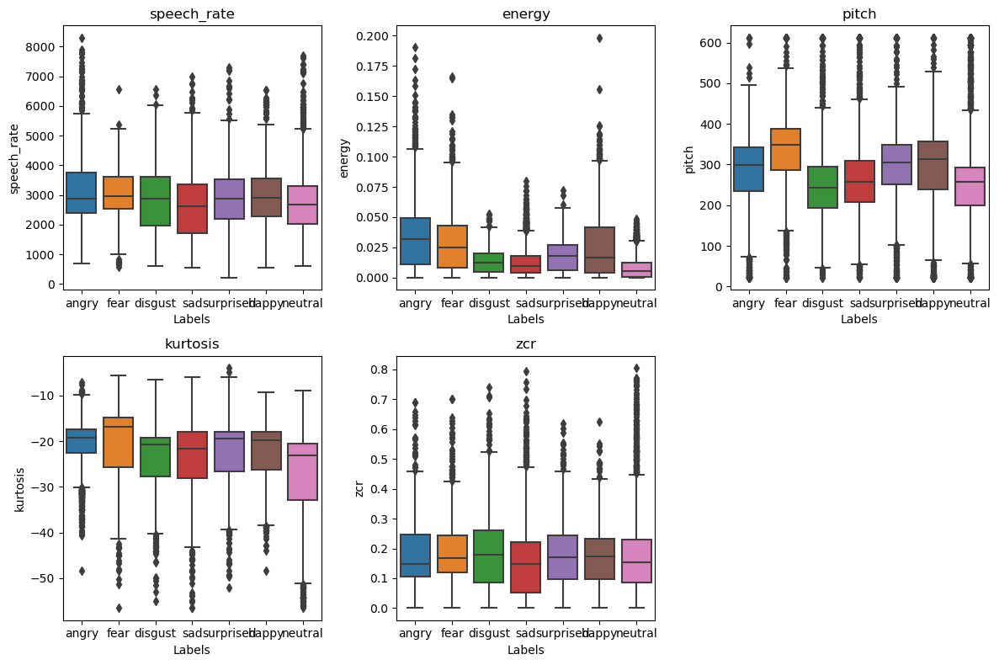

In [79]:
plt.figure(figsize=(12, 8))

features = ['speech_rate', 'energy', 'pitch', 'kurtosis', 'zcr']
labels = one_sec_features_df['label'].unique()

for i, feature in enumerate(features):
    plt.subplot(2, 3, i+1)
    
    # Create a list to store data for each label
    data_list = []
    
    for label in labels:
        data = one_sec_features_df[one_sec_features_df['label'] == label][feature]
        data_list.append(data)
    
    # Plotting boxplots with labels
    sns.boxplot(data=data_list)
    plt.xlabel('Labels')
    plt.ylabel(feature)
    plt.title(feature)
    
    # Map numbers to labels
    label_mapping = {label_num: label for label_num, label in enumerate(labels)}
    plt.xticks(range(len(labels)), [label_mapping[label_num] for label_num in range(len(labels))])

plt.tight_layout()
plt.show()

In [80]:
#split mfcc and concat it again

In [81]:

# Convert MFCC values to a list of dictionaries
mfcc_list = []
for mfcc_values in one_sec_features_df['mfcc']:
    mfcc_dict = {'MFCC_' + str(i): value for i, value in enumerate(mfcc_values)}
    mfcc_list.append(mfcc_dict)

# Create DataFrame from the list of dictionaries
mfcc_f_df = pd.DataFrame(mfcc_list)

#print the mfcc_f_df DataFrame
print(mfcc_f_df.head())

# Reset the indices of the DataFrames
mfcc_f_df.reset_index(drop=True, inplace=True)
one_sec_features_df.reset_index(drop=True, inplace=True)


       MFCC_0      MFCC_1     MFCC_2     MFCC_3     MFCC_4     MFCC_5  \
0 -380.720947   11.379191 -16.717091 -30.709850 -23.975277 -16.032944   
1 -349.955017   75.931557 -20.315983   1.925091 -47.624393 -22.772991   
2 -655.986084  112.606697  -4.058913  -3.127421  22.648708  -7.317529   
3 -375.864868   32.591972 -12.592405 -12.226795 -37.106400 -41.287407   
4 -462.842896   76.280350 -22.445457   5.849327 -21.825060 -22.999687   

      MFCC_6     MFCC_7     MFCC_8     MFCC_9    MFCC_10   MFCC_11    MFCC_12  \
0 -25.121958  -8.389911  -4.933112 -16.674885 -12.966288 -6.275843 -14.187851   
1 -30.056374 -22.603569  -7.103318 -18.701283 -11.429674 -9.648455 -20.049328   
2 -24.529654   1.330291   6.853499  -1.398296 -19.852018 -5.118433 -10.837395   
3 -21.353937 -16.755238 -15.245461 -21.434219 -12.523762 -8.928702 -12.290853   
4 -27.833645  -0.856590   1.245448 -25.756409   4.143682 -3.909323 -29.759756   

    MFCC_13    MFCC_14    MFCC_15    MFCC_16    MFCC_17    MFCC_18   MFCC_

In [82]:
# Concatenate the DataFrames
one_sec_features_df = pd.concat([mfcc_f_df, one_sec_features_df], axis=1)

# Print the concatenated DataFrame
print(one_sec_features_df.head())

       MFCC_0      MFCC_1     MFCC_2     MFCC_3     MFCC_4     MFCC_5  \
0 -380.720947   11.379191 -16.717091 -30.709850 -23.975277 -16.032944   
1 -349.955017   75.931557 -20.315983   1.925091 -47.624393 -22.772991   
2 -655.986084  112.606697  -4.058913  -3.127421  22.648708  -7.317529   
3 -375.864868   32.591972 -12.592405 -12.226795 -37.106400 -41.287407   
4 -462.842896   76.280350 -22.445457   5.849327 -21.825060 -22.999687   

      MFCC_6     MFCC_7     MFCC_8     MFCC_9  ...    MFCC_17    MFCC_18  \
0 -25.121958  -8.389911  -4.933112 -16.674885  ...  12.424396  -4.862238   
1 -30.056374 -22.603569  -7.103318 -18.701283  ...  -5.285856 -14.443264   
2 -24.529654   1.330291   6.853499  -1.398296  ... -11.523915  -9.140912   
3 -21.353937 -16.755238 -15.245461 -21.434219  ...  23.002254   8.427843   
4 -27.833645  -0.856590   1.245448 -25.756409  ...  -2.324223   8.393923   

    MFCC_19  label                                               mfcc  \
0  4.486614  angry  [-380.72095

In [83]:

#drop the MFCC column
one_sec_features_df = one_sec_features_df.drop('mfcc', axis=1)
one_sec_features_df.head()

,MFCC_0,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,...,MFCC_16,MFCC_17,MFCC_18,MFCC_19,label,speech_rate,energy,pitch,zcr,kurtosis
0,-380.720947,11.379191,-16.717091,-30.709850,-23.975277,-16.032944,-25.121958,-8.389911,-4.933112,-16.674885,...,-0.680129,12.424396,-4.862238,4.486614,angry,4671.352730,0.020579,290.143918,0.348740,-27.066853
1,-349.955017,75.931557,-20.315983,1.925091,-47.624393,-22.772991,-30.056374,-22.603569,-7.103318,-18.701283,...,-6.194547,-5.285856,-14.443264,2.662728,angry,2415.019843,0.024109,297.041489,0.098465,-26.866858
2,-655.986084,112.606697,-4.058913,-3.127421,22.648708,-7.317529,-24.529654,1.330291,6.853499,-1.398296,...,-4.986732,-11.523915,-9.140912,-4.052466,angry,2121.109653,0.001389,195.763016,0.083442,-32.082344
3,-375.864868,32.591972,-12.592405,-12.226795,-37.106400,-41.287407,-21.353937,-16.755238,-15.245461,-21.434219,...,11.444404,23.002254,8.427843,3.783119,fear,3786.256122,0.015825,379.024157,0.249237,-24.473726
4,-462.842896,76.280350,-22.445457,5.849327,-21.825060,-22.999687,-27.833645,-0.856590,1.245448,-25.756409,...,-3.286831,-2.324223,8.393923,0.921897,fear,2514.232647,0.014560,231.266332,0.157913,-27.614307


In [84]:
one_sec_features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12274 entries, 0 to 12273
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MFCC_0       12274 non-null  float32
 1   MFCC_1       12274 non-null  float32
 2   MFCC_2       12274 non-null  float32
 3   MFCC_3       12274 non-null  float32
 4   MFCC_4       12274 non-null  float32
 5   MFCC_5       12274 non-null  float32
 6   MFCC_6       12274 non-null  float32
 7   MFCC_7       12274 non-null  float32
 8   MFCC_8       12274 non-null  float32
 9   MFCC_9       12274 non-null  float32
 10  MFCC_10      12274 non-null  float32
 11  MFCC_11      12274 non-null  float32
 12  MFCC_12      12274 non-null  float32
 13  MFCC_13      12274 non-null  float32
 14  MFCC_14      12274 non-null  float32
 15  MFCC_15      12274 non-null  float32
 16  MFCC_16      12274 non-null  float32
 17  MFCC_17      12274 non-null  float32
 18  MFCC_18      12274 non-null  float32
 19  MFCC

In [85]:
one_sec_features_df.describe()

,MFCC_0,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,...,MFCC_15,MFCC_16,MFCC_17,MFCC_18,MFCC_19,speech_rate,energy,pitch,zcr,kurtosis
count,12274.000000,12274.000000,12274.000000,12274.000000,12274.000000,12274.000000,12274.000000,12274.000000,12274.000000,12274.000000,...,12274.000000,12274.000000,12274.000000,12274.000000,12274.000000,12274.000000,1.227400e+04,12274.000000,12274.000000,12274.000000
mean,-492.363129,60.037544,-3.471001,5.974834,-9.097084,-6.174835,-13.039093,-2.956584,-2.504437,-2.493667,...,1.815404,-2.079421,3.649811,1.745079,3.758247,2856.690403,1.976761e-02,279.077479,0.177875,-22.978422
std,175.625717,38.888229,24.430182,18.330973,18.032425,14.757199,12.410401,11.598539,9.098893,8.920317,...,8.419647,8.240972,9.677116,10.067231,8.764468,1007.558406,2.158339e-02,107.794894,0.115431,7.446321
min,-1131.370850,-107.400047,-123.062500,-90.398911,-77.423004,-58.697491,-61.580372,-47.537361,-41.999207,-40.295605,...,-22.018730,-32.692909,-27.944082,-31.780252,-30.867666,209.735468,2.126556e-13,21.554252,0.000000,-56.568542
25%,-554.839554,33.008628,-19.118137,-5.785183,-22.181973,-16.880367,-21.178629,-11.106696,-8.551865,-8.327036,...,-3.735917,-7.151640,-2.277611,-4.340844,-1.888280,2137.559586,3.775525e-03,219.182299,0.091893,-27.435762
50%,-444.973450,57.413090,-2.516578,6.919515,-8.008797,-6.875866,-13.502068,-3.072678,-2.769448,-2.401677,...,1.215958,-3.258356,2.353640,0.339862,2.315981,2839.193512,1.363416e-02,280.642217,0.161410,-20.590484
75%,-373.870178,86.704266,12.496483,17.761029,3.895844,3.373937,-4.812088,4.942995,3.300785,3.438613,...,6.387820,1.612210,7.623417,5.302735,7.324386,3515.145269,2.799936e-02,339.197394,0.239258,-18.082373
max,-123.352356,195.958008,81.910332,82.666725,49.698608,58.831505,36.956501,41.569706,43.201569,37.432457,...,53.213203,46.505051,48.348316,50.471924,42.987530,8308.409634,1.982726e-01,612.500000,0.804443,-3.947127


In [86]:
#onehalf_sec_features extraction

In [87]:

# Create empty lists to store the extracted features
mfcc_features = []
speech_rate_features = []
energy_features = []
pitch_features = []
zcr_features = []
kurtosis_features = []

# Iterate through each row in the one_sec_df DataFrame
for index, row in onehalf_sec_df.iterrows():
    audio = row['segment']
    
    # Extract MFCC features
    mfcc_features.append(extract_mfcc_features(audio))
    
    # Extract speech rate features
    speech_rate_features.append(extract_speech_rate_features(audio))
    
    # Extract energy features
    energy_features.append(extract_energy_features(audio))
    
    # Extract pitch features
    pitch_features.append(extract_pitch_features(audio))
    
    # Extract zero crossing rate features
    zcr_features.append(extract_zcr_features(audio))
    
    # Extract kurtosis features
    kurtosis_features.append(extract_kurtosis_features(audio))

# Create a new DataFrame to store the extracted features
onehalf_sec_features_df = pd.DataFrame({
    'label': onehalf_sec_df['label'],
    'mfcc': mfcc_features,
    'speech_rate': speech_rate_features,
    'energy': energy_features,
    'pitch': pitch_features,
    'zcr': zcr_features,
    'kurtosis': kurtosis_features
})

# Save the features_df DataFrame to a CSV file
onehalf_sec_features_df.to_csv('onehalf_sec_features.csv', index=False)

In [88]:
print(onehalf_sec_features_df.info())
onehalf_sec_features_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9170 entries, 0 to 9169
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   label        9170 non-null   object 
 1   mfcc         9170 non-null   object 
 2   speech_rate  9170 non-null   float64
 3   energy       9170 non-null   float32
 4   pitch        9170 non-null   float64
 5   zcr          9170 non-null   float64
 6   kurtosis     9170 non-null   float32
dtypes: float32(2), float64(3), object(2)
memory usage: 430.0+ KB
None


,label,mfcc,speech_rate,energy,pitch,zcr,kurtosis
0,angry,"[-379.69852, 26.909782, -15.906857, -14.148296...",3948.670712,0.022481,301.015132,0.277967,-27.038792
1,angry,"[-444.5806, 83.829895, -13.719177, -10.894273,...",2322.664969,0.015133,269.403458,0.084805,-29.216526
2,fear,"[-373.18784, 55.95048, -18.791105, -11.195445,...",3099.554778,0.020016,364.156461,0.192507,-24.823328
3,fear,"[-602.70807, 51.492626, -17.747007, 25.226305,...",3404.589501,0.000983,103.035440,0.269265,-31.721228
4,fear,"[-409.5763, -8.764608, -20.942116, 1.4832155, ...",4168.034101,0.034181,301.633697,0.334691,-23.251375


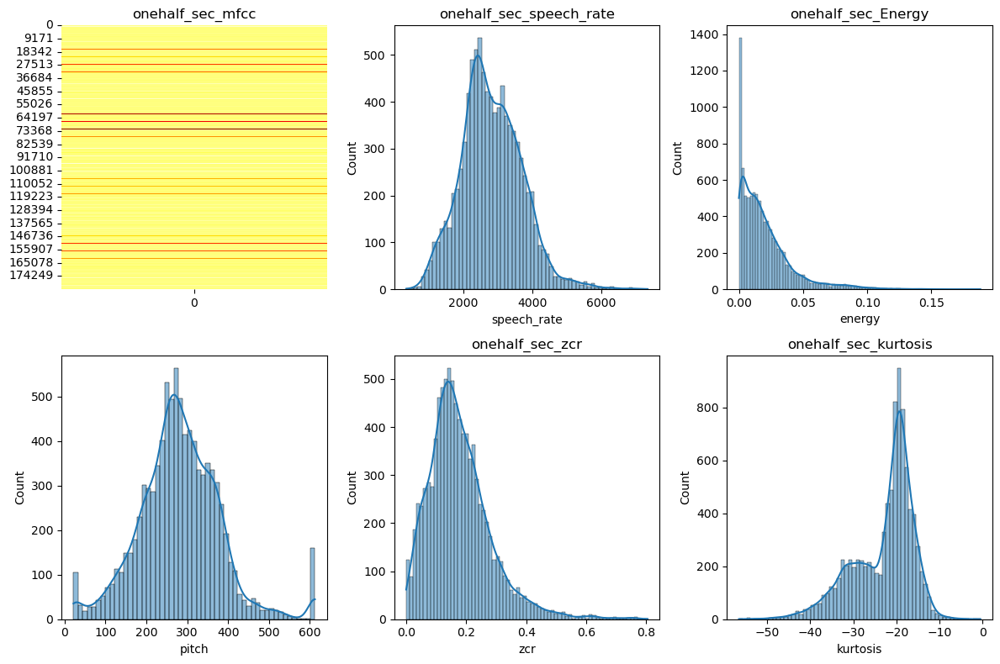

In [89]:
# Plotting the features
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
sns.heatmap(onehalf_sec_features_df['mfcc'].apply(lambda x: x.reshape(-1, 1)).explode().tolist(), cmap='hot', cbar=False)
plt.title('onehalf_sec_mfcc')

plt.subplot(2, 3, 2)
sns.histplot(onehalf_sec_features_df['speech_rate'], kde=True)
plt.title('onehalf_sec_speech_rate')

plt.subplot(2, 3, 3)
sns.histplot(onehalf_sec_features_df['energy'], kde=True)
plt.title('onehalf_sec_Energy')

plt.subplot(2, 3, 4)
sns.histplot(onehalf_sec_features_df['pitch'], kde=True)

plt.subplot(2, 3, 5)
sns.histplot(onehalf_sec_features_df['zcr'], kde=True)
plt.title('onehalf_sec_zcr')

plt.subplot(2, 3, 6)
sns.histplot(onehalf_sec_features_df['kurtosis'], kde=True)
plt.title('onehalf_sec_kurtosis')

plt.tight_layout()
plt.show()


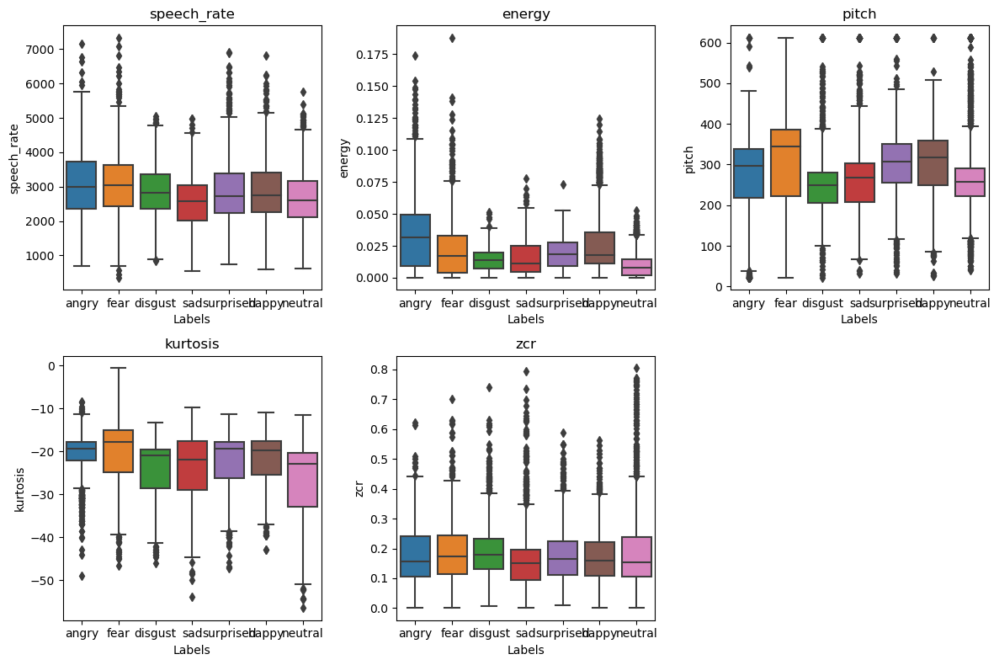

In [90]:
plt.figure(figsize=(12, 8))

features = ['speech_rate', 'energy', 'pitch', 'kurtosis', 'zcr']
labels = onehalf_sec_features_df['label'].unique()

for i, feature in enumerate(features):
    plt.subplot(2, 3, i+1)
    
    # Create a list to store data for each label
    data_list = []
    
    for label in labels:
        data = onehalf_sec_features_df[onehalf_sec_features_df['label'] == label][feature]
        data_list.append(data)
    
    # Plotting boxplots with labels
    sns.boxplot(data=data_list)
    plt.xlabel('Labels')
    plt.ylabel(feature)
    plt.title(feature)
    
    # Map numbers to labels
    label_mapping = {label_num: label for label_num, label in enumerate(labels)}
    plt.xticks(range(len(labels)), [label_mapping[label_num] for label_num in range(len(labels))])

plt.tight_layout()
plt.show()

In [91]:
#split mfcc and concat it again

In [92]:

# Convert MFCC values to a list of dictionaries
mfcc_list = []
for mfcc_values in onehalf_sec_features_df['mfcc']:
    mfcc_dict = {'MFCC_' + str(i): value for i, value in enumerate(mfcc_values)}
    mfcc_list.append(mfcc_dict)

# Create DataFrame from the list of dictionaries
mfcc_f_df = pd.DataFrame(mfcc_list)

#print the mfcc_f_df DataFrame
print(mfcc_f_df.head())

# Reset the indices of the DataFrames
mfcc_f_df.reset_index(drop=True, inplace=True)
onehalf_sec_features_df.reset_index(drop=True, inplace=True)


       MFCC_0     MFCC_1     MFCC_2     MFCC_3     MFCC_4     MFCC_5  \
0 -379.698517  26.909782 -15.906857 -14.148296 -35.029301 -16.221771   
1 -444.580597  83.829895 -13.719177 -10.894273 -16.255299 -21.125029   
2 -373.187836  55.950481 -18.791105 -11.195445 -38.020950 -40.155178   
3 -602.708069  51.492626 -17.747007  25.226305 -10.225192  -7.008499   
4 -409.576294  -8.764608 -20.942116   1.483215 -27.888565 -21.502954   

      MFCC_6     MFCC_7     MFCC_8     MFCC_9    MFCC_10    MFCC_11  \
0 -26.335997 -15.790354  -3.964281 -17.958021 -13.575852  -6.876298   
1 -26.713640 -11.713777  -6.588698 -12.228564  -9.390857  -9.829292   
2 -23.863613 -17.088945 -12.685497 -22.393513  -8.582314  -9.935423   
3 -26.525293  15.100931   6.378860 -23.870928   7.043544   4.188670   
4  -9.887221  -3.750205   0.886030   4.348086  22.857431  10.016431   

     MFCC_12    MFCC_13   MFCC_14    MFCC_15   MFCC_16    MFCC_17    MFCC_18  \
0 -17.063068  -3.993936 -7.655173  -1.636910 -0.890938   9.6

In [93]:
# Concatenate the DataFrames
onehalf_sec_features_df = pd.concat([mfcc_f_df, onehalf_sec_features_df], axis=1)

# Print the concatenated DataFrame
print(onehalf_sec_features_df.head())

       MFCC_0     MFCC_1     MFCC_2     MFCC_3     MFCC_4     MFCC_5  \
0 -379.698517  26.909782 -15.906857 -14.148296 -35.029301 -16.221771   
1 -444.580597  83.829895 -13.719177 -10.894273 -16.255299 -21.125029   
2 -373.187836  55.950481 -18.791105 -11.195445 -38.020950 -40.155178   
3 -602.708069  51.492626 -17.747007  25.226305 -10.225192  -7.008499   
4 -409.576294  -8.764608 -20.942116   1.483215 -27.888565 -21.502954   

      MFCC_6     MFCC_7     MFCC_8     MFCC_9  ...    MFCC_17    MFCC_18  \
0 -26.335997 -15.790354  -3.964281 -17.958021  ...   9.635897  -4.566542   
1 -26.713640 -11.713777  -6.588698 -12.228564  ... -11.165871 -17.211706   
2 -23.863613 -17.088945 -12.685497 -22.393513  ...  17.303473  11.534898   
3 -26.525293  15.100931   6.378860 -23.870928  ...  -7.086918   0.545630   
4  -9.887221  -3.750205   0.886030   4.348086  ...   2.315547  -1.813547   

    MFCC_19  label                                               mfcc  \
0  3.990544  angry  [-379.69852, 26.9

In [94]:

#drop the MFCC column
onehalf_sec_features_df = onehalf_sec_features_df.drop('mfcc', axis=1)
onehalf_sec_features_df.head()

,MFCC_0,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,...,MFCC_16,MFCC_17,MFCC_18,MFCC_19,label,speech_rate,energy,pitch,zcr,kurtosis
0,-379.698517,26.909782,-15.906857,-14.148296,-35.029301,-16.221771,-26.335997,-15.790354,-3.964281,-17.958021,...,-0.890938,9.635897,-4.566542,3.990544,angry,3948.670712,0.022481,301.015132,0.277967,-27.038792
1,-444.580597,83.829895,-13.719177,-10.894273,-16.255299,-21.125029,-26.713640,-11.713777,-6.588698,-12.228564,...,-7.003698,-11.165871,-17.211706,-1.169933,angry,2322.664969,0.015133,269.403458,0.084805,-29.216526
2,-373.187836,55.950481,-18.791105,-11.195445,-38.020950,-40.155178,-23.863613,-17.088945,-12.685497,-22.393513,...,6.440189,17.303473,11.534898,6.136726,fear,3099.554778,0.020016,364.156461,0.192507,-24.823328
3,-602.708069,51.492626,-17.747007,25.226305,-10.225192,-7.008499,-26.525293,15.100931,6.378860,-23.870928,...,-3.717397,-7.086918,0.545630,-6.679377,fear,3404.589501,0.000983,103.035440,0.269265,-31.721228
4,-409.576294,-8.764608,-20.942116,1.483215,-27.888565,-21.502954,-9.887221,-3.750205,0.886030,4.348086,...,-3.281255,2.315547,-1.813547,-0.327815,fear,4168.034101,0.034181,301.633697,0.334691,-23.251375


In [95]:
onehalf_sec_features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9170 entries, 0 to 9169
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MFCC_0       9170 non-null   float32
 1   MFCC_1       9170 non-null   float32
 2   MFCC_2       9170 non-null   float32
 3   MFCC_3       9170 non-null   float32
 4   MFCC_4       9170 non-null   float32
 5   MFCC_5       9170 non-null   float32
 6   MFCC_6       9170 non-null   float32
 7   MFCC_7       9170 non-null   float32
 8   MFCC_8       9170 non-null   float32
 9   MFCC_9       9170 non-null   float32
 10  MFCC_10      9170 non-null   float32
 11  MFCC_11      9170 non-null   float32
 12  MFCC_12      9170 non-null   float32
 13  MFCC_13      9170 non-null   float32
 14  MFCC_14      9170 non-null   float32
 15  MFCC_15      9170 non-null   float32
 16  MFCC_16      9170 non-null   float32
 17  MFCC_17      9170 non-null   float32
 18  MFCC_18      9170 non-null   float32
 19  MFCC_1

In [96]:
onehalf_sec_features_df.describe()

,MFCC_0,MFCC_1,MFCC_2,MFCC_3,MFCC_4,MFCC_5,MFCC_6,MFCC_7,MFCC_8,MFCC_9,...,MFCC_15,MFCC_16,MFCC_17,MFCC_18,MFCC_19,speech_rate,energy,pitch,zcr,kurtosis
count,9170.000000,9170.000000,9170.000000,9170.000000,9170.000000,9170.000000,9170.000000,9170.000000,9170.000000,9170.000000,...,9170.000000,9170.000000,9170.000000,9170.000000,9170.000000,9170.000000,9.170000e+03,9170.000000,9170.000000,9170.000000
mean,-486.829498,59.275097,-4.535974,4.914430,-9.661437,-5.649954,-12.969113,-3.523009,-2.675127,-2.695377,...,1.853010,-2.209243,3.373211,1.511437,3.267486,2823.279917,2.013151e-02,281.461396,0.178430,-22.891014
std,159.079056,34.241653,23.306503,18.340355,16.622000,14.260065,11.306378,10.854990,8.578794,8.074596,...,8.086153,7.556316,8.533885,9.215948,7.975925,875.383778,2.063738e-02,99.474957,0.105552,7.053286
min,-1131.370850,-102.688576,-123.062500,-88.886055,-79.570053,-50.098339,-69.264664,-55.824505,-44.997639,-34.052528,...,-23.319349,-25.947649,-21.593185,-23.338802,-23.645048,351.493772,8.995772e-13,21.554252,0.000000,-56.568542
25%,-551.357178,34.395063,-18.761287,-6.275259,-21.505996,-15.758592,-20.689714,-10.629144,-8.186597,-7.601838,...,-3.318420,-6.906149,-1.769070,-3.941935,-1.803525,2238.862561,5.256878e-03,223.456459,0.108871,-27.425213
50%,-443.602448,60.402889,-3.877969,5.577549,-8.598098,-6.982811,-13.557700,-3.308452,-2.732392,-2.637446,...,1.180275,-3.256413,2.269070,0.275388,2.097483,2753.066690,1.475253e-02,277.779220,0.161694,-20.472517
75%,-381.563972,81.356161,10.414547,16.997259,2.727936,2.725486,-5.790350,3.743682,2.575311,2.421076,...,6.141308,1.097970,7.280060,4.861498,6.779691,3396.304473,2.766009e-02,340.663662,0.229422,-18.204109
max,-142.097961,169.382675,77.812027,74.305862,49.228989,62.091896,32.895435,43.818027,43.942516,33.108547,...,44.884979,41.292149,43.254292,45.888100,40.960899,7336.342782,1.881031e-01,612.500000,0.804443,-0.539697


In [97]:
from sklearn.impute import SimpleImputer
from sklearn.covariance import EllipticEnvelope

# Create an instance of SimpleImputer
imputer = SimpleImputer(strategy='mean')

# Convert the data to a DataFrame
data_df = pd.DataFrame(data)

# Impute missing values in the data
data_imputed = imputer.fit_transform(data_df)

# Create and fit the Elliptic Envelope model
envelope = EllipticEnvelope(contamination=0.05)
envelope.fit(data_imputed)

# Continue with outlier detection and visualization using the fitted model

EllipticEnvelope(contamination=0.05)

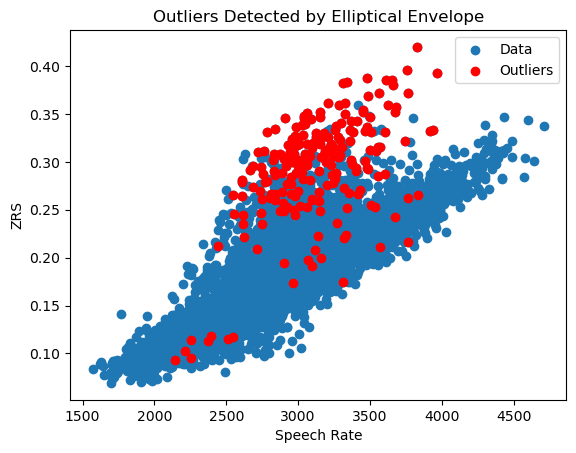

Number of outliers: 212


In [98]:
from sklearn.pipeline import make_pipeline

# Select the columns for outlier detection
columns = ['MFCC_0', 'MFCC_1', 'MFCC_2', 'MFCC_3', 'MFCC_4', 'MFCC_5', 'MFCC_6',
           'MFCC_7', 'MFCC_8', 'MFCC_9', 'MFCC_10', 'MFCC_11', 'MFCC_12',
           'MFCC_13', 'MFCC_14', 'MFCC_15', 'MFCC_16', 'MFCC_17', 'MFCC_18',
           'MFCC_19', 'speech_rate', 'energy', 'pitch', 'zcr', 'kurtosis']

data = three_sec_features_df[columns].values

# Create a pipeline with an imputer and the Elliptical Envelope model
pipeline = make_pipeline(SimpleImputer(strategy='mean'), EllipticEnvelope(contamination=0.05))

# Fit the pipeline to impute missing values and detect outliers
pipeline.fit(data)

# Impute missing values in the data
data_imputed = pipeline.named_steps['simpleimputer'].transform(data)

# Detect outliers
outlier_mask = pipeline.named_steps['ellipticenvelope'].predict(data_imputed) == -1
outliers = three_sec_features_df[outlier_mask]

# Count the number of outliers
num_outliers = outliers.shape[0]

# Visualize the outliers
plt.scatter(three_sec_features_df['speech_rate'], three_sec_features_df['zcr'], label='Data')
plt.scatter(outliers['speech_rate'], outliers['zcr'], color='r', label='Outliers')
plt.xlabel('Speech Rate')
plt.ylabel('ZRS')
plt.title('Outliers Detected by Elliptical Envelope')
plt.legend()
plt.show()

# Print the number of outliers
print('Number of outliers:', num_outliers)

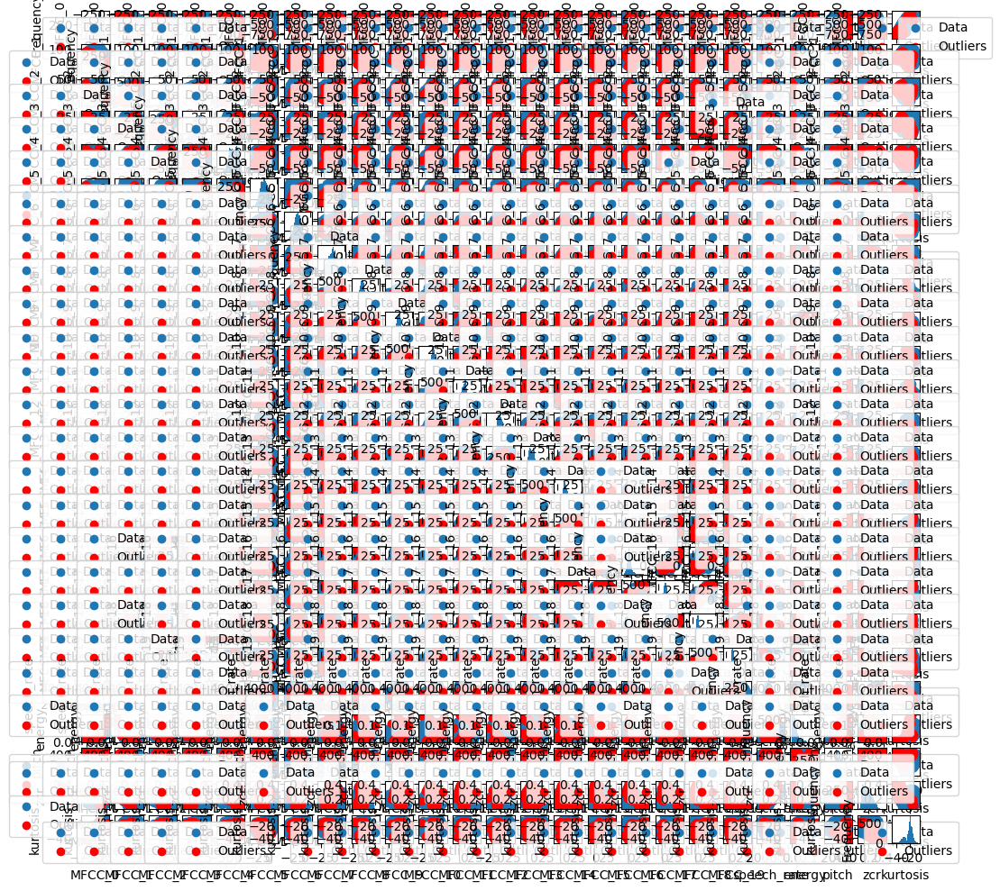

Number of outliers: 212


In [99]:
#outlier detection for three_sec_features_df

# Select the columns for outlier detection
columns = ['MFCC_0', 'MFCC_1', 'MFCC_2', 'MFCC_3', 'MFCC_4', 'MFCC_5', 'MFCC_6',
           'MFCC_7', 'MFCC_8', 'MFCC_9', 'MFCC_10', 'MFCC_11', 'MFCC_12',
           'MFCC_13', 'MFCC_14', 'MFCC_15', 'MFCC_16', 'MFCC_17', 'MFCC_18',
           'MFCC_19', 'speech_rate', 'energy', 'pitch', 'zcr', 'kurtosis']

data = three_sec_features_df[columns].values

# Create a pipeline with an imputer and the Elliptical Envelope model
pipeline = make_pipeline(SimpleImputer(strategy='mean'), EllipticEnvelope(contamination=0.05))

# Fit the pipeline to impute missing values and detect outliers
pipeline.fit(data)

# Impute missing values in the data
data_imputed = pipeline.named_steps['simpleimputer'].transform(data)

# Detect outliers
outlier_mask = pipeline.named_steps['ellipticenvelope'].predict(data_imputed) == -1
outliers = three_sec_features_df[outlier_mask]

# Visualize the outliers for all columns
num_columns = data_imputed.shape[1]  # Use the actual number of columns in the data

# Create a grid of scatter plots
fig, axes = plt.subplots(num_columns, num_columns, figsize=(12, 12))

# Iterate over each pair of columns
for i in range(num_columns):
    for j in range(num_columns):
        if i == j:
            # Plot histograms for diagonal elements
            axes[i, j].hist(data_imputed[:, i], bins=30)
            axes[i, j].set_xlabel(columns[i])
            axes[i, j].set_ylabel('Frequency')
        else:
            # Plot scatter plots for non-diagonal elements
            axes[i, j].scatter(data_imputed[:, j], data_imputed[:, i], label='Data')
            axes[i, j].scatter(outliers[columns[j]], outliers[columns[i]], color='r', label='Outliers')
            axes[i, j].set_xlabel(columns[j])
            axes[i, j].set_ylabel(columns[i])
            axes[i, j].legend()

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Print the number of outliers
print('Number of outliers:', outliers.shape[0])

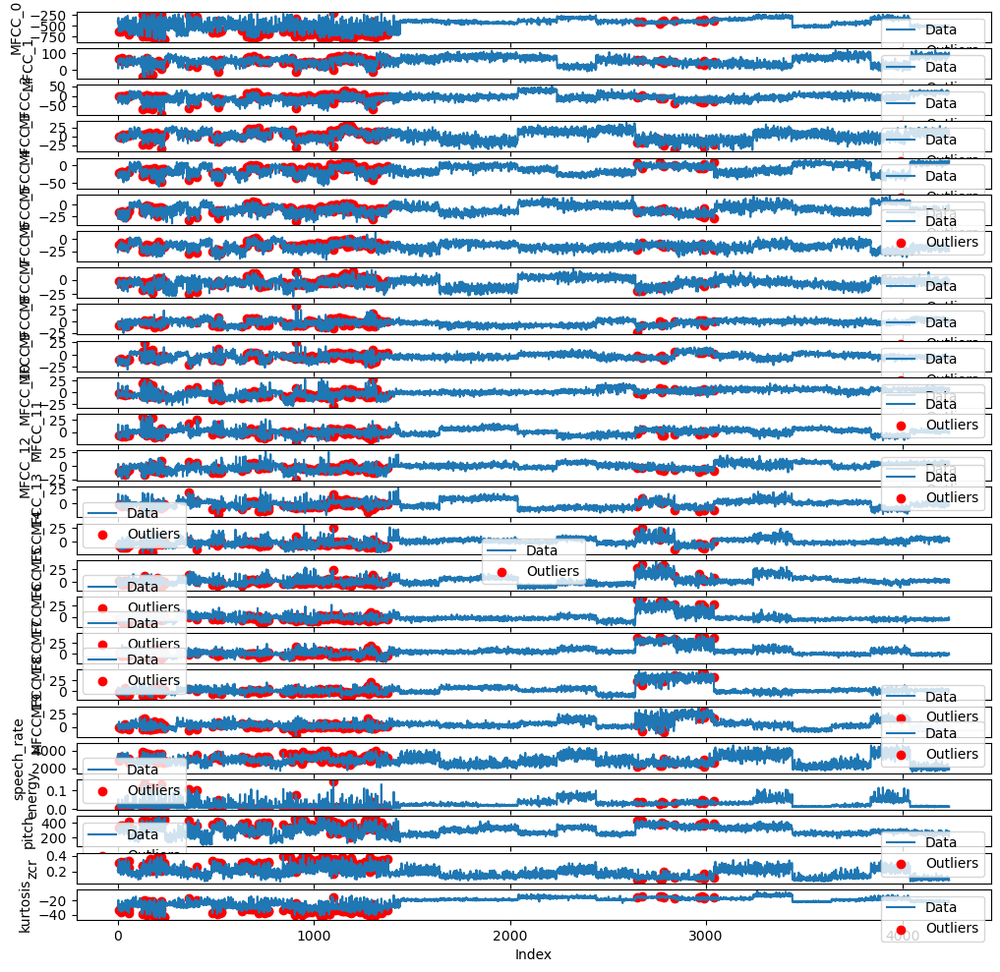

Number of data points: 4240
Number of outliers: 212


In [100]:
#outlier detection for three_sec_features_df

# Select the columns for outlier detection
columns = ['MFCC_0', 'MFCC_1', 'MFCC_2', 'MFCC_3', 'MFCC_4', 'MFCC_5', 'MFCC_6',
           'MFCC_7', 'MFCC_8', 'MFCC_9', 'MFCC_10', 'MFCC_11', 'MFCC_12',
           'MFCC_13', 'MFCC_14', 'MFCC_15', 'MFCC_16', 'MFCC_17', 'MFCC_18',
           'MFCC_19', 'speech_rate', 'energy', 'pitch', 'zcr', 'kurtosis']

data = three_sec_features_df[columns].values

# Create a pipeline with an imputer and the Elliptical Envelope model
pipeline = make_pipeline(SimpleImputer(strategy='mean'), EllipticEnvelope(contamination=0.05))

# Fit the pipeline to impute missing values and detect outliers
pipeline.fit(data)

# Impute missing values in the data
data_imputed = pipeline.named_steps['simpleimputer'].transform(data)

# Detect outliers
outlier_mask = pipeline.named_steps['ellipticenvelope'].predict(data_imputed) == -1
outliers = three_sec_features_df[outlier_mask]

# Visualize the outliers for each column
num_columns = data_imputed.shape[1]  # Number of columns in data_imputed

# Create subplots for each column
fig, axes = plt.subplots(num_columns, 1, figsize=(12, 12), sharex=True)

# Iterate over each column
for i in range(num_columns):
    # Plot the values of the column
    axes[i].plot(data_imputed[:, i], label='Data')

    # Highlight the outliers
    outliers_column = outliers[columns[i]]
    outlier_indices = outliers_column.index
    axes[i].scatter(outlier_indices, outliers_column, color='r', label='Outliers')

    axes[i].set_ylabel(columns[i])
    axes[i].legend()

# Set the x-axis label
axes[-1].set_xlabel('Index')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

print('Number of data points:', len(data_imputed))

# Print the number of outliers
print('Number of outliers:', len(outliers))

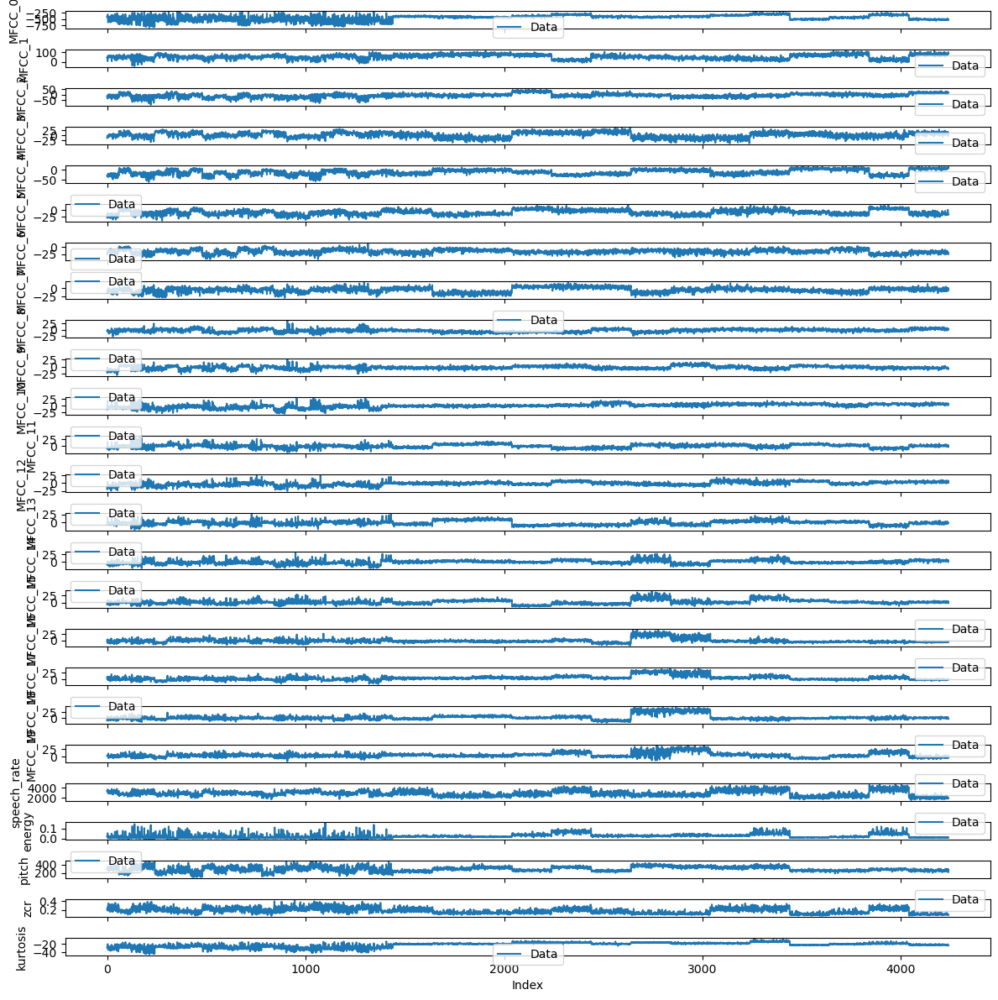

Number of data points: 4028
Number of outliers dropped: 212


In [101]:

# Drop outliers from the DataFrame
three_sec_features_df = three_sec_features_df.drop(outliers.index)

# Visualize the remaining data after dropping outliers
num_columns = data_imputed.shape[1]  # Number of columns in data_imputed

# Create subplots for each column
fig, axes = plt.subplots(num_columns, 1, figsize=(12, 12), sharex=True)

# Iterate over each column
for i in range(num_columns):
    # Plot the values of the column
    axes[i].plot(data_imputed[:, i], label='Data')

    axes[i].set_ylabel(columns[i])
    axes[i].legend()

# Set the x-axis label
axes[-1].set_xlabel('Index')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Print the number of data points after dropping outliers
print('Number of data points:', len(three_sec_features_df))

# Print the number of outliers dropped
print('Number of outliers dropped:', len(outliers))

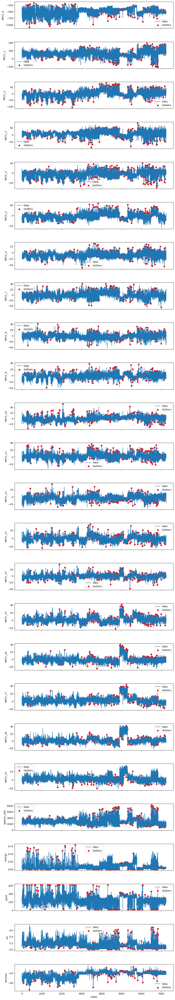

Number of data points: 7244
Number of outliers: 363


In [102]:

#outlier detection for  two_sec_features_df

# Select the columns for outlier detection
columns = ['MFCC_0', 'MFCC_1', 'MFCC_2', 'MFCC_3', 'MFCC_4', 'MFCC_5', 'MFCC_6',
           'MFCC_7', 'MFCC_8', 'MFCC_9', 'MFCC_10', 'MFCC_11', 'MFCC_12',
           'MFCC_13', 'MFCC_14', 'MFCC_15', 'MFCC_16', 'MFCC_17', 'MFCC_18',
           'MFCC_19', 'speech_rate', 'energy', 'pitch', 'zcr', 'kurtosis']

# Extract the data for outlier detection
data = two_sec_features_df[columns].values

# Create a pipeline with an imputer and the Elliptical Envelope model
pipeline = make_pipeline(SimpleImputer(strategy='mean'), EllipticEnvelope(contamination=0.05))

# Fit the pipeline to impute missing values and detect outliers
pipeline.fit(data)

# Impute missing values in the data
data_imputed = pipeline.named_steps['simpleimputer'].transform(data)

# Detect outliers
outlier_mask = pipeline.named_steps['ellipticenvelope'].predict(data_imputed) == -1
outliers = two_sec_features_df[outlier_mask]

# Configure the spacing between subplots and figure size
fig, axes = plt.subplots(nrows=len(columns), ncols=1, figsize=(12, 3 * len(columns)), sharex=True,
                         gridspec_kw={'hspace': 0.5})

# Iterate over each column
for i, column in enumerate(columns):
    # Plot the values of the column
    axes[i].plot(data_imputed[:, i], label='Data')

    # Highlight the outliers
    outliers_column = outliers[column]
    outlier_indices = outliers_column.index
    axes[i].scatter(outlier_indices, outliers_column, color='r', label='Outliers')

    axes[i].set_ylabel(column)
    axes[i].legend()

# Set the x-axis label
axes[-1].set_xlabel('Index')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Print the number of data points
print('Number of data points:', len(data_imputed))

# Print the number of outliers
print('Number of outliers:', len(outliers))

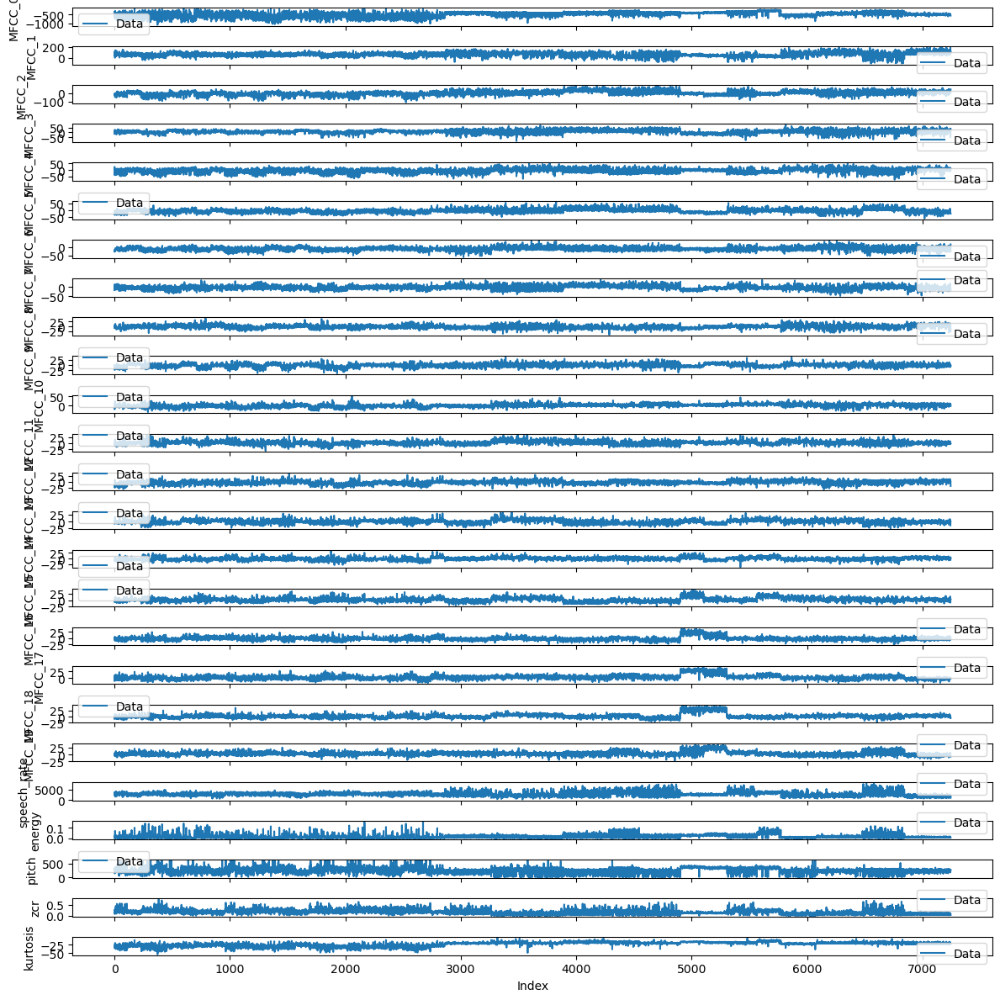

Number of data points: 6881
Number of outliers dropped: 363


In [103]:
# Drop outliers from the DataFrame
two_sec_features_df = two_sec_features_df.drop(outliers.index)

# Visualize the remaining data after dropping outliers
num_columns = data_imputed.shape[1]  # Number of columns in data_imputed

# Create subplots for each column
fig, axes = plt.subplots(num_columns, 1, figsize=(12, 12), sharex=True)

# Iterate over each column
for i in range(num_columns):
    # Plot the values of the column
    axes[i].plot(data_imputed[:, i], label='Data')

    axes[i].set_ylabel(columns[i])
    axes[i].legend()

# Set the x-axis label
axes[-1].set_xlabel('Index')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Print the number of data points after dropping outliers
print('Number of data points:', len(two_sec_features_df))

# Print the number of outliers dropped
print('Number of outliers dropped:', len(outliers))

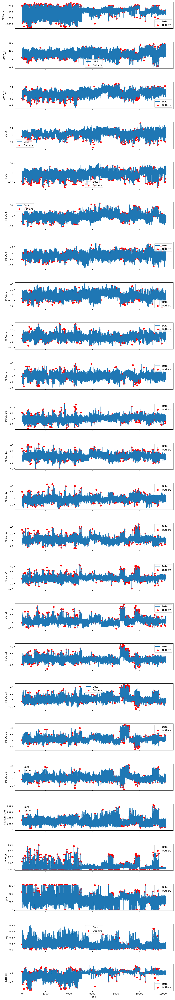

Number of data points: 12274
Number of outliers: 614


In [104]:

#outlier detection for one_sec_features_df


# Select the columns for outlier detection
columns = ['MFCC_0', 'MFCC_1', 'MFCC_2', 'MFCC_3', 'MFCC_4', 'MFCC_5', 'MFCC_6',
           'MFCC_7', 'MFCC_8', 'MFCC_9', 'MFCC_10', 'MFCC_11', 'MFCC_12',
           'MFCC_13', 'MFCC_14', 'MFCC_15', 'MFCC_16', 'MFCC_17', 'MFCC_18',
           'MFCC_19', 'speech_rate', 'energy', 'pitch', 'zcr', 'kurtosis']

# Extract the data for outlier detection
data = one_sec_features_df[columns].values

# Create a pipeline with an imputer and the Elliptical Envelope model
pipeline = make_pipeline(SimpleImputer(strategy='mean'), EllipticEnvelope(contamination=0.05))

# Fit the pipeline to impute missing values and detect outliers
pipeline.fit(data)

# Impute missing values in the data
data_imputed = pipeline.named_steps['simpleimputer'].transform(data)

# Detect outliers
outlier_mask = pipeline.named_steps['ellipticenvelope'].predict(data_imputed) == -1
outliers = one_sec_features_df[outlier_mask]

# Configure the spacing between subplots and figure size
fig, axes = plt.subplots(nrows=len(columns), ncols=1, figsize=(12, 3 * len(columns)), sharex=True,
                         gridspec_kw={'hspace': 0.5})

# Iterate over each column
for i, column in enumerate(columns):
    # Plot the values of the column
    axes[i].plot(data_imputed[:, i], label='Data')

    # Highlight the outliers
    outliers_column = outliers[column]
    outlier_indices = outliers_column.index
    axes[i].scatter(outlier_indices, outliers_column, color='r', label='Outliers')

    axes[i].set_ylabel(column)
    axes[i].legend()

# Set the x-axis label
axes[-1].set_xlabel('Index')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Print the number of data points
print('Number of data points:', len(data_imputed))

# Print the number of outliers
print('Number of outliers:', len(outliers))

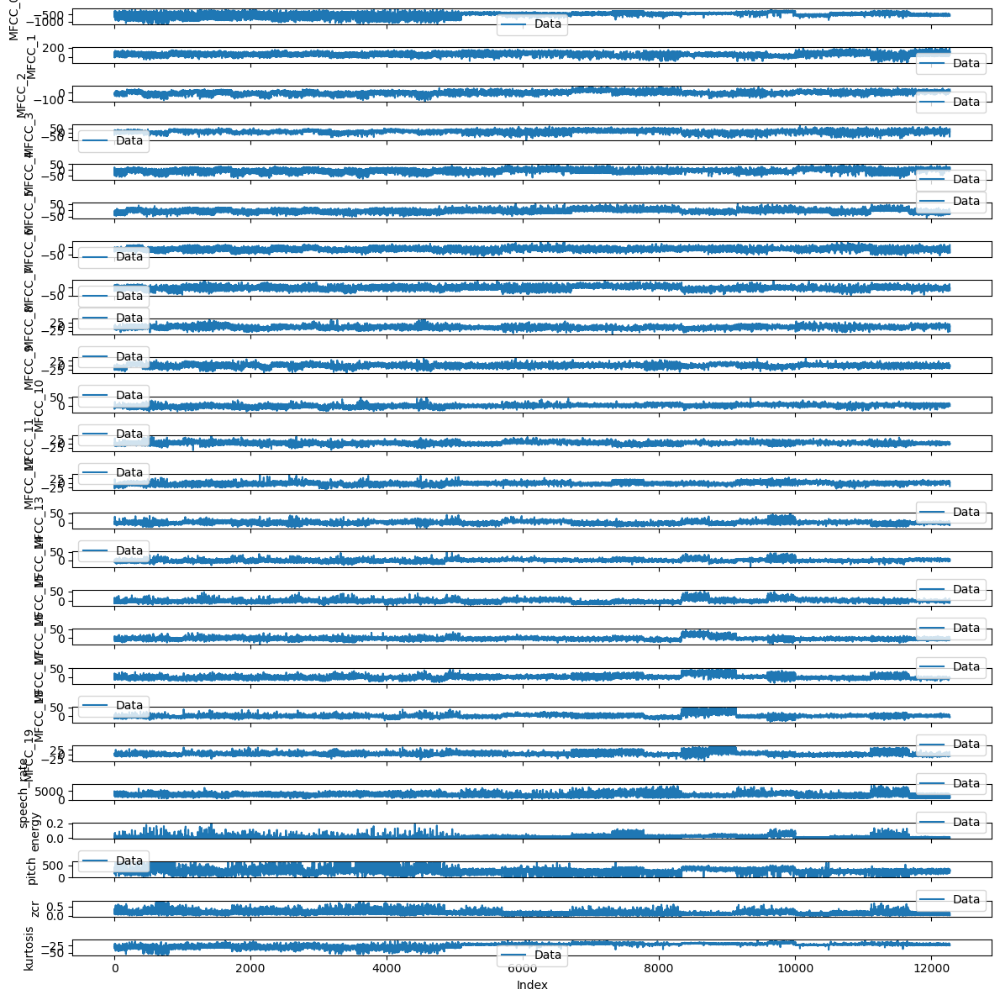

Number of data points: 11660
Number of outliers dropped: 614


In [105]:
# Drop outliers from the DataFrame
one_sec_features_df = one_sec_features_df.drop(outliers.index)

# Visualize the remaining data after dropping outliers
num_columns = data_imputed.shape[1]  # Number of columns in data_imputed

# Create subplots for each column
fig, axes = plt.subplots(num_columns, 1, figsize=(12, 12), sharex=True)

# Iterate over each column
for i in range(num_columns):
    # Plot the values of the column
    axes[i].plot(data_imputed[:, i], label='Data')

    axes[i].set_ylabel(columns[i])
    axes[i].legend()

# Set the x-axis label
axes[-1].set_xlabel('Index')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Print the number of data points after dropping outliers
print('Number of data points:', len(one_sec_features_df))

# Print the number of outliers dropped
print('Number of outliers dropped:', len(outliers))

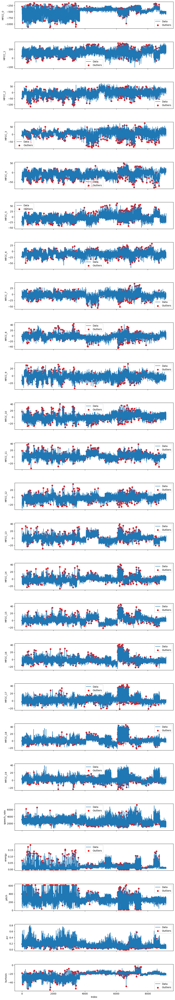

Number of data points: 9170
Number of outliers: 459


In [106]:

#outlier detection for onehalf_sec_features_df


# Select the columns for outlier detection
columns = ['MFCC_0', 'MFCC_1', 'MFCC_2', 'MFCC_3', 'MFCC_4', 'MFCC_5', 'MFCC_6',
           'MFCC_7', 'MFCC_8', 'MFCC_9', 'MFCC_10', 'MFCC_11', 'MFCC_12',
           'MFCC_13', 'MFCC_14', 'MFCC_15', 'MFCC_16', 'MFCC_17', 'MFCC_18',
           'MFCC_19', 'speech_rate', 'energy', 'pitch', 'zcr', 'kurtosis']

# Extract the data for outlier detection
data = onehalf_sec_features_df[columns].values

# Create a pipeline with an imputer and the Elliptical Envelope model
pipeline = make_pipeline(SimpleImputer(strategy='mean'), EllipticEnvelope(contamination=0.05))

# Fit the pipeline to impute missing values and detect outliers
pipeline.fit(data)

# Impute missing values in the data
data_imputed = pipeline.named_steps['simpleimputer'].transform(data)

# Detect outliers
outlier_mask = pipeline.named_steps['ellipticenvelope'].predict(data_imputed) == -1
outliers = onehalf_sec_features_df[outlier_mask]

# Configure the spacing between subplots and figure size
fig, axes = plt.subplots(nrows=len(columns), ncols=1, figsize=(12, 3 * len(columns)), sharex=True,
                         gridspec_kw={'hspace': 0.5})

# Iterate over each column
for i, column in enumerate(columns):
    # Plot the values of the column
    axes[i].plot(data_imputed[:, i], label='Data')

    # Highlight the outliers
    outliers_column = outliers[column]
    outlier_indices = outliers_column.index
    axes[i].scatter(outlier_indices, outliers_column, color='r', label='Outliers')

    axes[i].set_ylabel(column)
    axes[i].legend()

# Set the x-axis label
axes[-1].set_xlabel('Index')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Print the number of data points
print('Number of data points:', len(data_imputed))

# Print the number of outliers
print('Number of outliers:', len(outliers))

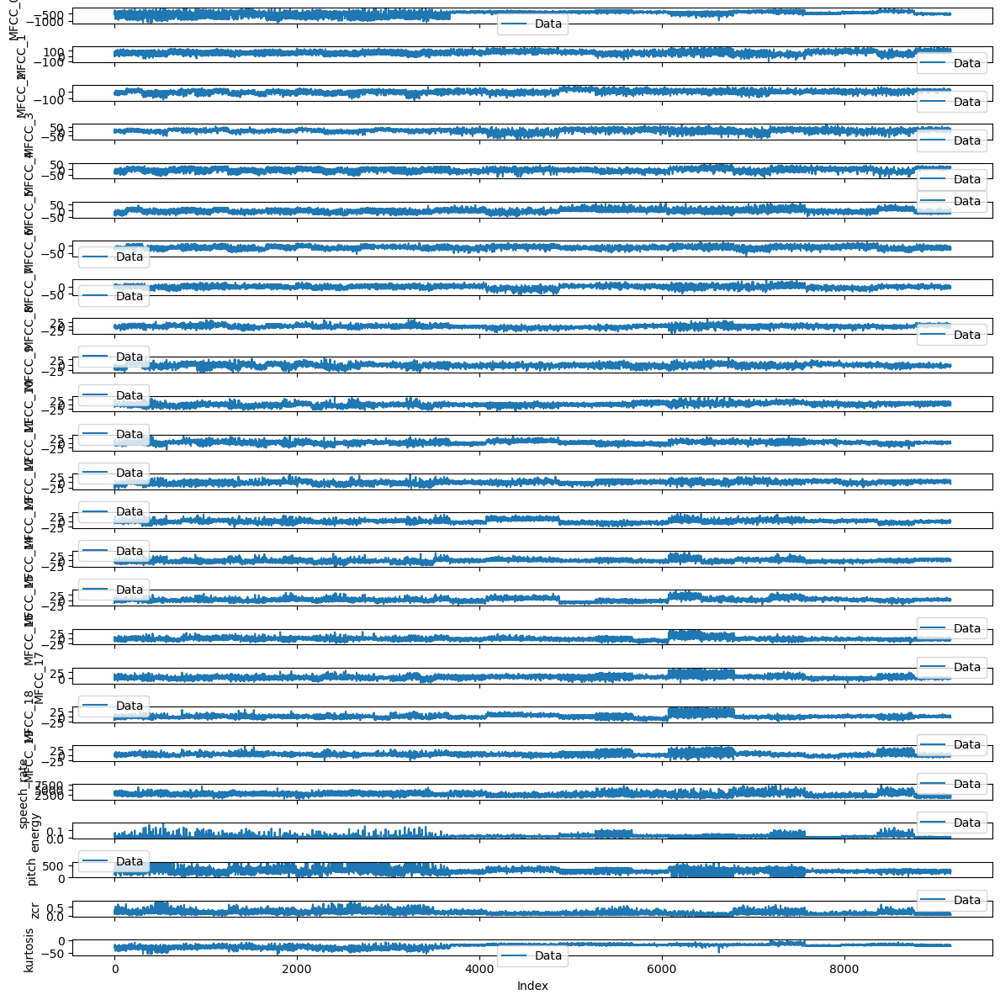

Number of data points: 8711
Number of outliers dropped: 459


In [107]:
# Drop outliers from the DataFrame
onehalf_sec_features_df = onehalf_sec_features_df.drop(outliers.index)

# Visualize the remaining data after dropping outliers
num_columns = data_imputed.shape[1]  # Number of columns in data_imputed

# Create subplots for each column
fig, axes = plt.subplots(num_columns, 1, figsize=(12, 12), sharex=True)

# Iterate over each column
for i in range(num_columns):
    # Plot the values of the column
    axes[i].plot(data_imputed[:, i], label='Data')

    axes[i].set_ylabel(columns[i])
    axes[i].legend()

# Set the x-axis label
axes[-1].set_xlabel('Index')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Print the number of data points after dropping outliers
print('Number of data points:', len(onehalf_sec_features_df))

# Print the number of outliers dropped
print('Number of outliers dropped:', len(outliers))

In [108]:
#!pip install --upgrade scikit-learn

In [109]:
#pip install --upgrade pip

In [110]:
#!pip install -U scikit-learn

In [111]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict, train_test_split



In [112]:
def plot_confusion_matrix(cm, classes, classifier_name):
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'{classifier_name} Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

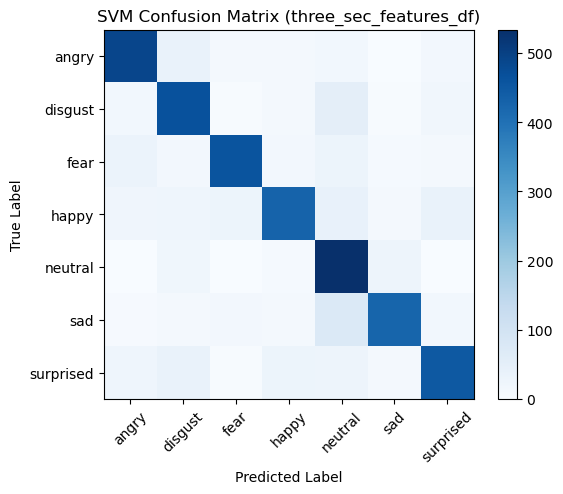

SVM Classification Report (three_sec_features_df):
              precision    recall  f1-score   support

       angry       0.83      0.84      0.84       580
     disgust       0.77      0.82      0.79       570
        fear       0.88      0.81      0.84       568
       happy       0.84      0.73      0.78       588
     neutral       0.70      0.91      0.79       590
         sad       0.88      0.77      0.82       554
   surprised       0.82      0.78      0.80       578

    accuracy                           0.81      4028
   macro avg       0.82      0.81      0.81      4028
weighted avg       0.82      0.81      0.81      4028



In [113]:

# SVM Model on three_sec_features_df by cross validation 
# Scaling the features
scaler = StandardScaler()
X_scaled_3sec = scaler.fit_transform(three_sec_features_df.drop('label', axis=1))
y_3sec = three_sec_features_df['label']

# Create an SVM classifier
svm_classifier_3sec = SVC()

# Perform cross-validation
svm_scores_3sec = cross_val_score(svm_classifier_3sec, X_scaled_3sec, y_3sec, cv=5)

# Train the SVM classifier on the entire dataset
svm_classifier_3sec.fit(X_scaled_3sec, y_3sec)

# Predict using cross-validation
y_pred_svm_3sec = cross_val_predict(svm_classifier_3sec, X_scaled_3sec, y_3sec, cv=5)

# Compute confusion matrix
cm_svm_3sec = confusion_matrix(y_3sec, y_pred_svm_3sec)

# Plot confusion matrix for SVM
plot_confusion_matrix(cm_svm_3sec, np.unique(y_3sec), 'SVM')
plt.title('SVM Confusion Matrix (three_sec_features_df)')
plt.show()

# Print classification report for SVM
classification_report_svm_3sec = classification_report(y_3sec, y_pred_svm_3sec)
print("SVM Classification Report (three_sec_features_df):")
print(classification_report_svm_3sec)


In [114]:
import joblib
# Define the filenames for saving the model and scaler
model_filename = "svm_model_3sec_allF.pkl"
scaler_filename = "scaler_3sec_allF.pkl"

# Save the SVM model and the StandardScaler to files
joblib.dump(svm_classifier_3sec, model_filename)
joblib.dump(scaler, scaler_filename)


['scaler_3sec_allF.pkl']

python(57040) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


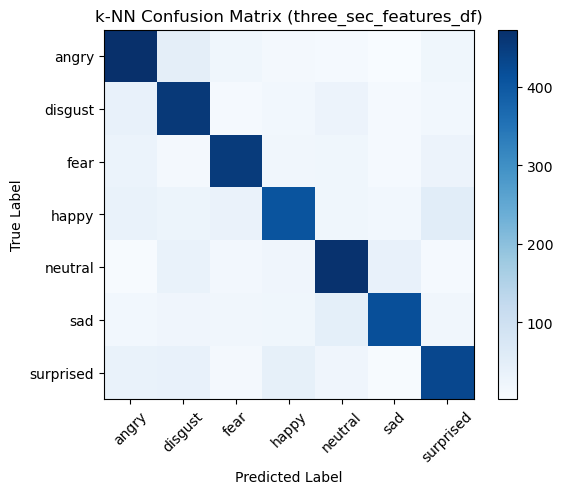

k-NN Classification Report (three_sec_features_df):
              precision    recall  f1-score   support

       angry       0.75      0.82      0.78       580
     disgust       0.72      0.80      0.76       570
        fear       0.81      0.80      0.80       568
       happy       0.76      0.69      0.73       588
     neutral       0.77      0.79      0.78       590
         sad       0.85      0.75      0.80       554
   surprised       0.75      0.74      0.75       578

    accuracy                           0.77      4028
   macro avg       0.77      0.77      0.77      4028
weighted avg       0.77      0.77      0.77      4028



In [115]:
# Train and visualize k-NN Classifier by cross validation on three_sec_features_df
knn_classifier_3sec = KNeighborsClassifier(n_neighbors=5)

# Perform cross-validation
knn_scores_3sec = cross_val_score(knn_classifier_3sec, X_scaled_3sec, y_3sec, cv=5)

# Train the k-NN classifier on the entire dataset
knn_classifier_3sec.fit(X_scaled_3sec, y_3sec)

# Predict using cross-validation
y_pred_knn_3sec = cross_val_predict(knn_classifier_3sec, X_scaled_3sec, y_3sec, cv=5)

# Compute confusion matrix
cm_knn_3sec = confusion_matrix(y_3sec, y_pred_knn_3sec)

# Plot confusion matrix for k-NN
plot_confusion_matrix(cm_knn_3sec, np.unique(y_3sec), 'k-NN')
plt.title('k-NN Confusion Matrix (three_sec_features_df)')
plt.show()

# Print classification report for k-NN
classification_report_knn_3sec = classification_report(y_3sec, y_pred_knn_3sec)
print("k-NN Classification Report (three_sec_features_df):")
print(classification_report_knn_3sec)

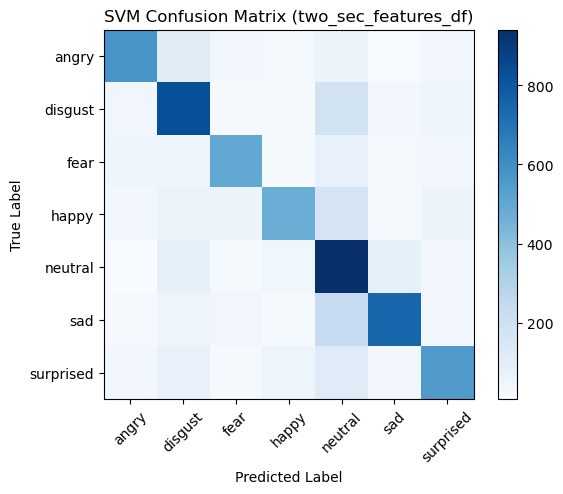

SVM Classification Report (two_sec_features_df):
              precision    recall  f1-score   support

       angry       0.77      0.68      0.72       846
     disgust       0.66      0.71      0.68      1174
        fear       0.73      0.67      0.70       743
       happy       0.73      0.54      0.62       882
     neutral       0.52      0.78      0.63      1208
         sad       0.77      0.66      0.71      1145
   surprised       0.70      0.62      0.66       883

    accuracy                           0.67      6881
   macro avg       0.70      0.66      0.67      6881
weighted avg       0.69      0.67      0.67      6881



In [116]:
# SVM Model on two_sec_features_df by cross validation 
# Scaling the features
scaler = StandardScaler()
X_scaled_2sec = scaler.fit_transform(two_sec_features_df.drop('label', axis=1))
y_2sec = two_sec_features_df['label']

# Create an SVM classifier
svm_classifier_2sec = SVC()

# Perform cross-validation
svm_scores_2sec = cross_val_score(svm_classifier_2sec, X_scaled_2sec, y_2sec, cv=5)

# Train the SVM classifier on the entire dataset
svm_classifier_2sec.fit(X_scaled_2sec, y_2sec)

# Predict using cross-validation
y_pred_svm_2sec = cross_val_predict(svm_classifier_2sec, X_scaled_2sec, y_2sec, cv=5)

# Compute confusion matrix
cm_svm_2sec = confusion_matrix(y_2sec, y_pred_svm_2sec)

# Plot confusion matrix for SVM
plot_confusion_matrix(cm_svm_2sec, np.unique(y_2sec), 'SVM')
plt.title('SVM Confusion Matrix (two_sec_features_df)')
plt.show()

# Print classification report for SVM
classification_report_svm_2sec = classification_report(y_2sec, y_pred_svm_2sec)
print("SVM Classification Report (two_sec_features_df):")
print(classification_report_svm_2sec)

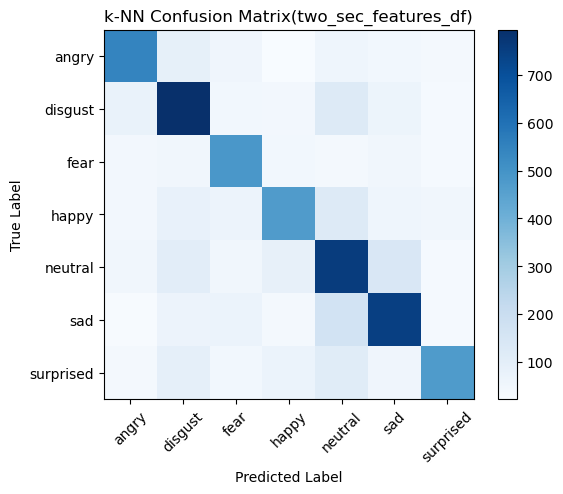

k-NN Classification Report (two_sec_features_df):
              precision    recall  f1-score   support

       angry       0.67      0.64      0.65       846
     disgust       0.63      0.68      0.65      1174
        fear       0.60      0.66      0.63       743
       happy       0.61      0.53      0.57       882
     neutral       0.55      0.63      0.59      1208
         sad       0.65      0.65      0.65      1145
   surprised       0.68      0.54      0.60       883

    accuracy                           0.62      6881
   macro avg       0.63      0.62      0.62      6881
weighted avg       0.62      0.62      0.62      6881



In [117]:
# Train and visualize k-NN Classifier by cross validation on two_sec_features_df
knn_classifier_2sec = KNeighborsClassifier(n_neighbors=5)

# Perform cross-validation
knn_scores_2sec = cross_val_score(knn_classifier_2sec, X_scaled_2sec, y_2sec, cv=5)

# Train the k-NN classifier on the entire dataset
knn_classifier_2sec.fit(X_scaled_2sec, y_2sec)

# Predict using cross-validation
y_pred_knn_2sec = cross_val_predict(knn_classifier_2sec, X_scaled_2sec, y_2sec, cv=5)

# Compute confusion matrix
cm_knn_2sec = confusion_matrix(y_2sec, y_pred_knn_2sec)

# Plot confusion matrix for k-NN
plot_confusion_matrix(cm_knn_2sec, np.unique(y_2sec), 'k-NN')
plt.title('k-NN Confusion Matrix(two_sec_features_df)')
plt.show()

# Print classification report for k-NN
classification_report_knn_2sec = classification_report(y_2sec, y_pred_knn_2sec)
print("k-NN Classification Report (two_sec_features_df):")
print(classification_report_knn_2sec)

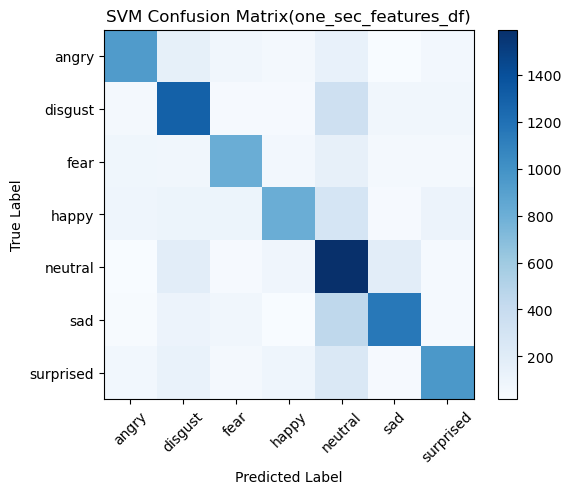

SVM Classification Report:
              precision    recall  f1-score   support

       angry       0.74      0.65      0.69      1427
     disgust       0.64      0.68      0.66      1908
        fear       0.69      0.65      0.67      1246
       happy       0.71      0.53      0.60      1528
     neutral       0.50      0.75      0.60      2125
         sad       0.75      0.62      0.68      1865
   surprised       0.72      0.61      0.67      1561

    accuracy                           0.65     11660
   macro avg       0.68      0.64      0.65     11660
weighted avg       0.67      0.65      0.65     11660



In [118]:
# SVM Model on one_sec_features_df by cross validation 
# Scaling the features
scaler = StandardScaler()
X_scaled_1sec = scaler.fit_transform(one_sec_features_df.drop('label', axis=1))
y_1sec = one_sec_features_df['label']

# Create an SVM classifier
svm_classifier_1sec = SVC()

# Perform cross-validation
svm_scores_1sec = cross_val_score(svm_classifier_1sec, X_scaled_1sec, y_1sec, cv=5)

# Train the SVM classifier on the entire dataset
svm_classifier_1sec.fit(X_scaled_1sec, y_1sec)

# Predict using cross-validation
y_pred_svm_1sec = cross_val_predict(svm_classifier_1sec, X_scaled_1sec, y_1sec, cv=5)

# Compute confusion matrix
cm_svm_1sec = confusion_matrix(y_1sec, y_pred_svm_1sec)

# Plot confusion matrix for SVM
plot_confusion_matrix(cm_svm_1sec, np.unique(y_1sec), 'SVM')
plt.title('SVM Confusion Matrix(one_sec_features_df)')
plt.show()

# Print classification report for SVM
classification_report_svm_1sec = classification_report(y_1sec, y_pred_svm_1sec)
print("SVM Classification Report:")
print(classification_report_svm_1sec)

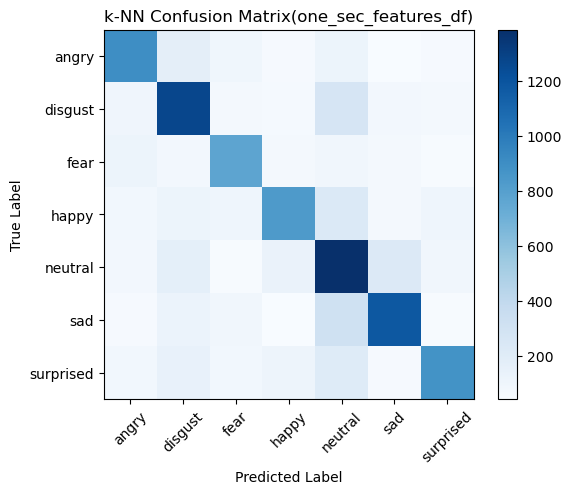

k-NN Classification Report:
              precision    recall  f1-score   support

       angry       0.64      0.63      0.63      1427
     disgust       0.61      0.67      0.64      1908
        fear       0.61      0.62      0.62      1246
       happy       0.64      0.54      0.59      1528
     neutral       0.53      0.65      0.59      2125
         sad       0.69      0.63      0.66      1865
   surprised       0.68      0.56      0.62      1561

    accuracy                           0.62     11660
   macro avg       0.63      0.62      0.62     11660
weighted avg       0.63      0.62      0.62     11660



In [119]:
# Train and visualize k-NN Classifier by cross validation on one_sec_features_df
knn_classifier_1sec = KNeighborsClassifier(n_neighbors=5)

# Perform cross-validation
knn_scores_1sec = cross_val_score(knn_classifier_1sec, X_scaled_1sec, y_1sec, cv=5)

# Train the k-NN classifier on the entire dataset
knn_classifier_1sec.fit(X_scaled_1sec, y_1sec)

# Predict using cross-validation
y_pred_knn_1sec = cross_val_predict(knn_classifier_1sec, X_scaled_1sec, y_1sec, cv=5)

# Compute confusion matrix
cm_knn_1sec = confusion_matrix(y_1sec, y_pred_knn_1sec)

# Plot confusion matrix for k-NN
plot_confusion_matrix(cm_knn_1sec, np.unique(y_1sec), 'k-NN')
plt.title('k-NN Confusion Matrix(one_sec_features_df)')
plt.show()

# Print classification report for k-NN
classification_report_knn_1sec = classification_report(y_1sec, y_pred_knn_1sec)
print("k-NN Classification Report:")
print(classification_report_knn_1sec)

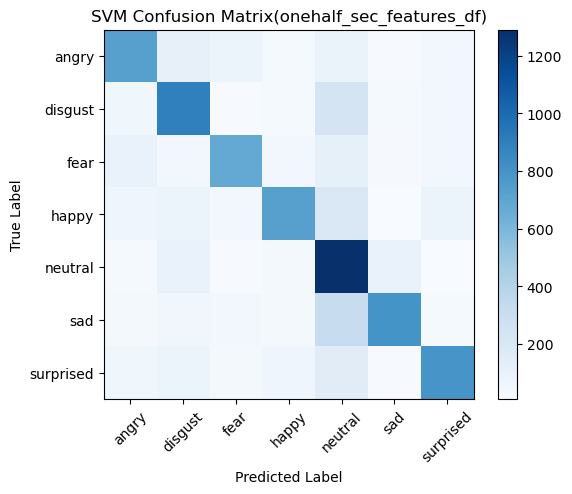

SVM Classification Report:
              precision    recall  f1-score   support

       angry       0.69      0.66      0.68      1101
     disgust       0.66      0.69      0.67      1304
        fear       0.74      0.65      0.69      1040
       happy       0.76      0.60      0.67      1208
     neutral       0.54      0.82      0.65      1574
         sad       0.81      0.62      0.70      1291
   surprised       0.75      0.66      0.70      1193

    accuracy                           0.68      8711
   macro avg       0.71      0.67      0.68      8711
weighted avg       0.70      0.68      0.68      8711



In [120]:
# SVM Model on onehalf_sec_features_df by cross validation 
# Scaling the features
scaler = StandardScaler()
X_scaled_1p5sec = scaler.fit_transform(onehalf_sec_features_df.drop('label', axis=1))
y_1p5sec = onehalf_sec_features_df['label']

# Create an SVM classifier
svm_classifier_1p5sec = SVC()

# Perform cross-validation
svm_scores_1p5sec = cross_val_score(svm_classifier_1p5sec, X_scaled_1p5sec, y_1p5sec, cv=5)

# Train the SVM classifier on the entire dataset
svm_classifier_1p5sec.fit(X_scaled_1p5sec, y_1p5sec)

# Predict using cross-validation
y_pred_svm_1p5sec = cross_val_predict(svm_classifier_1p5sec, X_scaled_1p5sec, y_1p5sec, cv=5)

# Compute confusion matrix
cm_svm_1p5sec = confusion_matrix(y_1p5sec, y_pred_svm_1p5sec)

# Plot confusion matrix for SVM
plot_confusion_matrix(cm_svm_1p5sec, np.unique(y_1p5sec), 'SVM')
plt.title('SVM Confusion Matrix(onehalf_sec_features_df)')
plt.show()

# Print classification report for SVM
classification_report_svm_1p5sec = classification_report(y_1p5sec, y_pred_svm_1p5sec)
print("SVM Classification Report:")
print(classification_report_svm_1p5sec)

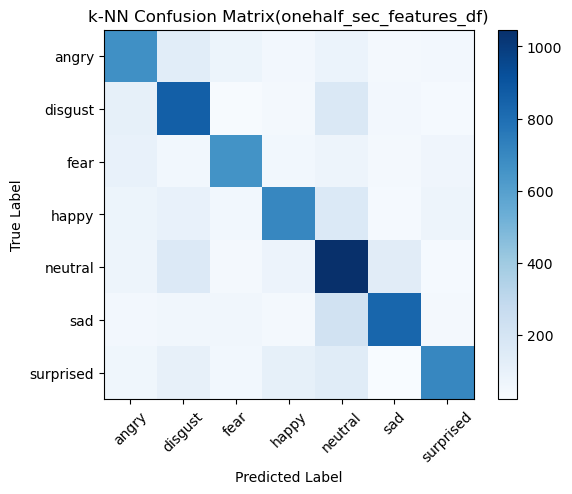

k-NN Classification Report:
              precision    recall  f1-score   support

       angry       0.59      0.61      0.60      1101
     disgust       0.59      0.66      0.62      1304
        fear       0.68      0.63      0.66      1040
       happy       0.65      0.58      0.62      1208
     neutral       0.55      0.67      0.60      1574
         sad       0.72      0.64      0.68      1291
   surprised       0.70      0.59      0.64      1193

    accuracy                           0.63      8711
   macro avg       0.64      0.63      0.63      8711
weighted avg       0.64      0.63      0.63      8711



In [121]:
# Train and visualize k-NN Classifier by cross validation on one_sec_features_df
knn_classifier_1p5sec = KNeighborsClassifier(n_neighbors=5)

# Perform cross-validation
knn_scores_1p5sec = cross_val_score(knn_classifier_1p5sec, X_scaled_1p5sec, y_1p5sec, cv=5)

# Train the k-NN classifier on the entire dataset
knn_classifier_1p5sec.fit(X_scaled_1p5sec, y_1p5sec)

# Predict using cross-validation
y_pred_knn_1p5sec = cross_val_predict(knn_classifier_1p5sec, X_scaled_1p5sec, y_1p5sec, cv=5)

# Compute confusion matrix
cm_knn_1p5sec = confusion_matrix(y_1p5sec, y_pred_knn_1p5sec)

# Plot confusion matrix for k-NN
plot_confusion_matrix(cm_knn_1p5sec, np.unique(y_1p5sec), 'k-NN')
plt.title('k-NN Confusion Matrix(onehalf_sec_features_df)')
plt.show()

# Print classification report for k-NN
classification_report_knn_1p5sec = classification_report(y_1p5sec, y_pred_knn_1p5sec)
print("k-NN Classification Report:")
print(classification_report_knn_1p5sec)

In [122]:
# For three_sec_features_df
print("Performance metrics for three_sec_features_df:")
print("-" * 40)

# SVM Model
print("SVM Model:")
print("Accuracy:", svm_scores_3sec.mean())
print("Classification Report:")
print(classification_report_svm_3sec)
print()

# k-NN Model
print("k-NN Model:")
print("Accuracy:", knn_scores_3sec.mean())
print("Classification Report:")
print(classification_report_knn_3sec)
print()

# For two_sec_features_df
print("Performance metrics for two_sec_features_df:")
print("-" * 40)

# SVM Model
print("SVM Model:")
print("Accuracy:", svm_scores_2sec.mean())
print("Classification Report:")
print(classification_report_svm_2sec)
print()

# k-NN Model
print("k-NN Model:")
print("Accuracy:", knn_scores_2sec.mean())
print("Classification Report:")
print(classification_report_knn_2sec)
print()

# For one_sec_features_df
print("Performance metrics for one_sec_features_df:")
print("-" * 40)

# SVM Model
print("SVM Model:")
print("Accuracy:", svm_scores_1sec.mean())
print("Classification Report:")
print(classification_report_svm_1sec)
print()

# k-NN Model
print("k-NN Model:")
print("Accuracy:", knn_scores_1sec.mean())
print("Classification Report:")
print(classification_report_knn_1sec)

# For onehalf_sec_features_df
print("Performance metrics for onehalf_sec_features_df:")
print("-" * 40)

# SVM Model
print("SVM Model:")
print("Accuracy:", svm_scores_1p5sec.mean())
print("Classification Report:")
print(classification_report_svm_1p5sec)
print()

# k-NN Model
print("k-NN Model:")
print("Accuracy:", knn_scores_1p5sec.mean())
print("Classification Report:")
print(classification_report_knn_1p5sec)

Performance metrics for three_sec_features_df:
----------------------------------------
SVM Model:
Accuracy: 0.8076895334679346
Classification Report:
              precision    recall  f1-score   support

       angry       0.83      0.84      0.84       580
     disgust       0.77      0.82      0.79       570
        fear       0.88      0.81      0.84       568
       happy       0.84      0.73      0.78       588
     neutral       0.70      0.91      0.79       590
         sad       0.88      0.77      0.82       554
   surprised       0.82      0.78      0.80       578

    accuracy                           0.81      4028
   macro avg       0.82      0.81      0.81      4028
weighted avg       0.82      0.81      0.81      4028


k-NN Model:
Accuracy: 0.770468073301173
Classification Report:
              precision    recall  f1-score   support

       angry       0.75      0.82      0.78       580
     disgust       0.72      0.80      0.76       570
        fear       0.81  

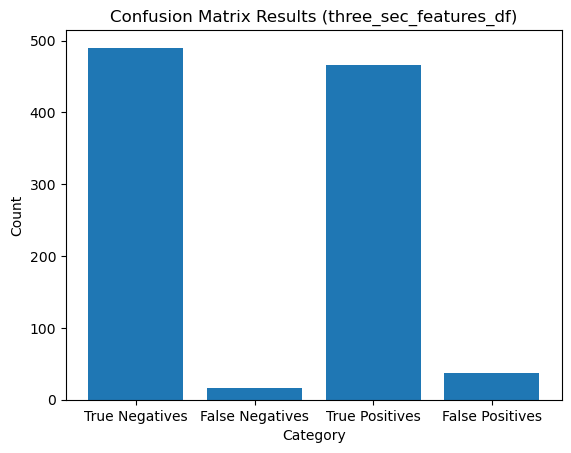

True negatives: 490
False negatives: 16
True positives: 466
False positives: 37


In [123]:
#for cm_svm_3sec
# Compute confusion matrix
cm_svm_3sec = confusion_matrix(y_3sec, y_pred_svm_3sec)

# Extract values from confusion matrix
true_negatives = cm_svm_3sec[0, 0]
false_negatives = cm_svm_3sec[1, 0]
true_positives = cm_svm_3sec[1, 1]
false_positives = cm_svm_3sec[0, 1]

# Define the labels and values for the bars
labels = ['True Negatives', 'False Negatives', 'True Positives', 'False Positives']
values = [true_negatives, false_negatives, true_positives, false_positives]

# Create a bar plot
plt.bar(labels, values)

# Set the plot title and axis labels
plt.title('Confusion Matrix Results (three_sec_features_df)')
plt.xlabel('Category')
plt.ylabel('Count')

# Display the plot
plt.show()

# Print the values
print("True negatives:", true_negatives)
print("False negatives:", false_negatives)
print("True positives:", true_positives)
print("False positives:", false_positives)

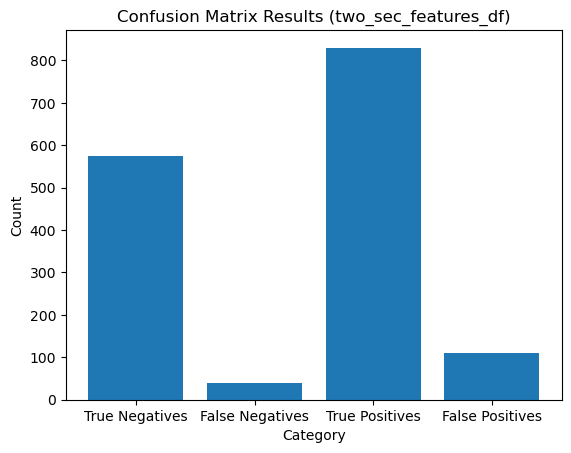

True negatives: 574
False negatives: 39
True positives: 830
False positives: 111


In [124]:
#for cm_svm_2sec
# Compute confusion matrix
cm_svm_2sec = confusion_matrix(y_2sec, y_pred_svm_2sec)

# Extract values from confusion matrix
true_negatives = cm_svm_2sec[0, 0]
false_negatives = cm_svm_2sec[1, 0]
true_positives = cm_svm_2sec[1, 1]
false_positives = cm_svm_2sec[0, 1]

# Define the labels and values for the bars
labels = ['True Negatives', 'False Negatives', 'True Positives', 'False Positives']
values = [true_negatives, false_negatives, true_positives, false_positives]

# Create a bar plot
plt.bar(labels, values)

# Set the plot title and axis labels
plt.title('Confusion Matrix Results (two_sec_features_df)')
plt.xlabel('Category')
plt.ylabel('Count')

# Display the plot
plt.show()

# Print the values
print("True negatives:", true_negatives)
print("False negatives:", false_negatives)
print("True positives:", true_positives)
print("False positives:", false_positives)

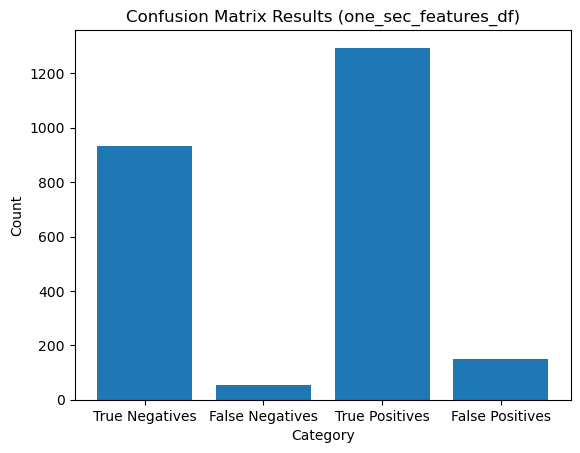

True negatives: 934
False negatives: 53
True positives: 1294
False positives: 151


In [125]:
#for cm_svm_1sec
# Compute confusion matrix
cm_svm_1sec = confusion_matrix(y_1sec, y_pred_svm_1sec)

# Extract values from confusion matrix
true_negatives = cm_svm_1sec[0, 0]
false_negatives = cm_svm_1sec[1, 0]
true_positives = cm_svm_1sec[1, 1]
false_positives = cm_svm_1sec[0, 1]

# Define the labels and values for the bars
labels = ['True Negatives', 'False Negatives', 'True Positives', 'False Positives']
values = [true_negatives, false_negatives, true_positives, false_positives]

# Create a bar plot
plt.bar(labels, values)

# Set the plot title and axis labels
plt.title('Confusion Matrix Results (one_sec_features_df)')
plt.xlabel('Category')
plt.ylabel('Count')

# Display the plot
plt.show()

# Print the values
print("True negatives:", true_negatives)
print("False negatives:", false_negatives)
print("True positives:", true_positives)
print("False positives:", false_positives)

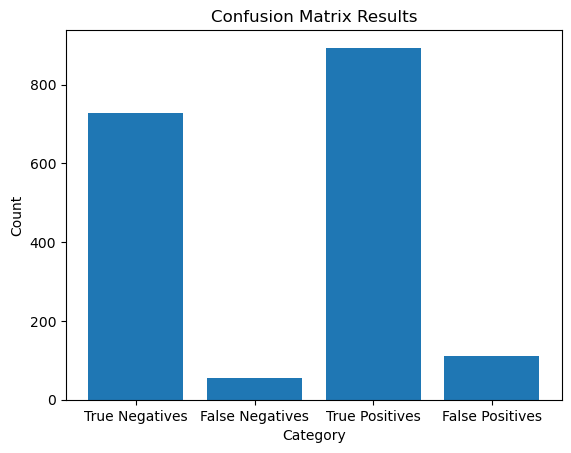

True negatives: 729
False negatives: 56
True positives: 894
False positives: 110


In [126]:
#for cm_svm_1p5sec
# Compute confusion matrix
cm_svm_1p5sec = confusion_matrix(y_1p5sec, y_pred_svm_1p5sec)

# Extract values from confusion matrix
true_negatives = cm_svm_1p5sec[0, 0]
false_negatives = cm_svm_1p5sec[1, 0]
true_positives = cm_svm_1p5sec[1, 1]
false_positives = cm_svm_1p5sec[0, 1]

# Define the labels and values for the bars
labels = ['True Negatives', 'False Negatives', 'True Positives', 'False Positives']
values = [true_negatives, false_negatives, true_positives, false_positives]

# Create a bar plot
plt.bar(labels, values)

# Set the plot title and axis labels
plt.title('Confusion Matrix Results')
plt.xlabel('Category')
plt.ylabel('Count')

# Display the plot
plt.show()

# Print the values
print("True negatives:", true_negatives)
print("False negatives:", false_negatives)
print("True positives:", true_positives)
print("False positives:", false_positives)

In [127]:
#Testing and pipeline

In [128]:
import librosa
import pandas as pd

# Define a function to extract features from an audio file
def extract_features(audio_file):
    # Load audio data
    data, sr = librosa.load(audio_file)
    
    # Extract features (you may need to adapt this based on your feature extraction functions)
    mfcc = librosa.feature.mfcc(y=data, sr=sr)
    speech_rate = librosa.feature.spectral_centroid(y=data, sr=sr)
    energy = librosa.feature.rms(y=data)
    pitch = librosa.yin(y=data, fmin=8, fmax=600)
    zcr = librosa.feature.zero_crossing_rate(data)
    kurtosis = librosa.feature.melspectrogram(y=data, sr=sr)
    
    # Create a DataFrame to store the features
    features_df = pd.DataFrame({
        'MFCC': [mfcc.mean(axis=1)],
        'speech_rate': speech_rate.mean(),
        'energy': energy.mean(),
        'pitch': pitch.mean(),
        'zcr': zcr.mean(),
        'kurtosis': kurtosis.mean()
    })
    
    return features_df

# Path to the test audio file
audio_file_path = '/Users/narjesmishal/Desktop/Grad Project 🎓/Datasets/TESS/YAF_disgust/YAF_witch_disgust.wav'

# Print the name of the audio file
print("Audio File:", audio_file_path)

# Extract features from the audio file
test_features_df = extract_features(audio_file_path)

# Display the extracted features
print("\nExtracted Features:")
print(test_features_df)


Audio File: /Users/narjesmishal/Desktop/Grad Project 🎓/Datasets/TESS/YAF_disgust/YAF_witch_disgust.wav

Extracted Features:
                                                MFCC  speech_rate    energy  \
0  [-446.21457, 62.691765, 5.4137425, 28.258272, ...  2996.859822  0.015156   

        pitch       zcr  kurtosis  
0  184.701593  0.201521  0.088086  


In [129]:

# Train the SVM classifier on the entire dataset
svm_classifier_3sec.fit(X_scaled_3sec, y_3sec)

# Predict emotions using the trained SVM classifier
predicted_emotions_svm = svm_classifier_3sec.predict(X_scaled_3sec)

# Add predicted emotions to the DataFrame
three_sec_features_df['predicted_emotion_svm'] = predicted_emotions_svm

# Print the DataFrame with predicted emotions
print(three_sec_features_df.head())


       MFCC_0     MFCC_1     MFCC_2     MFCC_3     MFCC_4     MFCC_5  \
0 -402.354187  45.496941 -16.031067 -13.147400 -29.022640 -17.991621   
1 -442.849670  50.083553 -16.972843  -2.305996 -27.620070 -30.621143   
2 -351.541107   5.673484 -35.926365  -2.951755 -32.013847 -21.657850   
3 -316.921478  41.879536 -20.910177  -7.606141 -36.110779 -11.258243   
4 -506.032806  63.114395  -6.281014  -1.664288 -20.396168 -14.316367   

      MFCC_6     MFCC_7    MFCC_8     MFCC_9  ...   MFCC_17   MFCC_18  \
0 -26.971144 -14.377636 -4.878340 -16.097713  ...  2.542727 -9.080364   
1 -23.921528  -7.925880 -6.352033 -22.824310  ...  9.431761  8.113358   
2 -16.141384  -6.728705 -0.360153  -3.910765  ...  0.076636 -0.864680   
3 -18.356668 -13.610368  0.338091 -18.819710  ...  9.520529  4.870512   
4 -21.415678  -2.098233 -3.243358 -11.200455  ... -1.365233 -2.073874   

    MFCC_19    label  speech_rate    energy       pitch       zcr   kurtosis  \
0  2.251245    angry  3384.480201  0.020303  289

In [130]:
import librosa
import numpy as np

# Function to preprocess audio
def preprocess_audio(audio_path, target_sr=16000):
    data, original_sr = librosa.load(audio_path)
    trimmed_data, _ = librosa.effects.trim(data)
    resampled_data = librosa.resample(trimmed_data, orig_sr=original_sr, target_sr=target_sr)
    return resampled_data

# Function to extract features
def extract_features(audio):
    mfcc = librosa.feature.mfcc(y=audio, sr=16000)
    mfcc_mean = np.mean(mfcc, axis=1)
    speech_rate = np.mean(librosa.feature.spectral_centroid(y=audio, sr=16000))
    energy = np.mean(librosa.feature.rms(y=audio))
    pitch = np.mean(librosa.yin(y=audio, fmin=8, fmax=600))
    zcr = np.mean(librosa.feature.zero_crossing_rate(audio))
    mel_spec = librosa.feature.melspectrogram(y=audio, sr=16000)
    kurtosis = np.mean(librosa.feature.mfcc(S=librosa.power_to_db(mel_spec)))
    return np.concatenate([mfcc_mean, [speech_rate, energy, pitch, zcr, kurtosis]])

# Load and preprocess the audio
audio_path = "/Users/narjesmishal/Desktop/Grad Project 🎓/Datasets/TESS/YAF_angry/YAF_bone_angry.wav" 
preprocessed_audio = preprocess_audio(audio_path)

# Extract features
audio_features = extract_features(preprocessed_audio)

# Standardize features using the same scaler used during training
X_test = scaler.transform(audio_features.reshape(1, -1))  # Assuming 'scaler' is your trained StandardScaler

# Predict emotion label using the SVM classifier
predicted_label = svm_classifier_3sec.predict(X_test)

print("Predicted emotion label:", predicted_label)


Predicted emotion label: ['angry']


In [131]:
#final pipline

In [134]:
#downloading the model

In [133]:
pip install joblib

python(57069) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Note: you may need to restart the kernel to use updated packages.
